**Supporting code for Jake Weber's ``SOCIAL CHOICE THEORY: AN APPLICATION ON VOTERS OF THE ASSOCIATED PRESS (AP) TOP 25 NCAA FOOTBALL RANKINGS'' in fulfillment of the requirements for the Master of Science degree in Computer Science.**

**Import Packages/Install Pandas Library**

In [ ]:
import numpy as np

# %pip install pandas
# https://stackoverflow.com/questions/62512095/sagemath-9-1-on-mac-install-numpy-pandas

import pandas as pd

from sage.graphs.connectivity import connected_components
from sage.graphs.connectivity import connected_components_subgraphs

from IPython.display import display

import matplotlib.pyplot as plt

**Helper Functions, Printing Functions, and Dictionaries**

In [31]:

'''Functions:'''

"""Description: We only want to process the voters that are in all rounds of data. Here we search to find who voted in each round and create a dictionary/indexing of 
those participants. We first return a list of names to be used to filter out which rows of the dataframe should be left.
We then give a dictionary in both index to name and name to index in order to switch back and forth later.
    Input: (List: list of dataframes for each round of voting containing the voters in their own column, string: name of the voters column)
    Output: (name list, name to index dictionary, index to name dictionary)
    """
def Voter_Intersection_Participation(list_of_dataframes, column_to_make_dict_of_string):
    # Instantiate Dictionaries
    name_index_dict = {}
    index_name_dict = {}
    
    # Determine how many loops are needed
    number_of_dataframes = len(list_of_dataframes)
    
    # Establish base intersection_array that will be updated
    intersection_array = list_of_dataframes[0][column_to_make_dict_of_string].sort_values()
    
    # Want to skip the first dataframe since it is the base case
    i = 1
    for i in range(number_of_dataframes):
        intersection_array = np.intersect1d(intersection_array, list_of_dataframes[i][column_to_make_dict_of_string],assume_unique=False,return_indices=False)
    
    # Create the dictionary with name keys and number values
    index = 0
    for name in intersection_array:
        name_index_dict[name] = index
        index += 1
    
    # Reverse the name_index_dict dictionary.
    for key in name_index_dict:
        index_name_dict[name_index_dict[key]] = key
    
    return list(name_index_dict.keys()), name_index_dict, index_name_dict

"""Description: This function takes in a dataframe that has format of the AP Polling Data from bakonydraco. We then input how we would like the 25 teams to be partitioned.
    This partition_list has length of the number of groups, and the ith entry gives the size of the ith group. This function is a step in processing the data into
    its desired form for comparison.
    Input: (pd.dataframe with ranked data, list of the group sizes of the partitioned rankings)
    Output: (pd.dataframe that has the corresponding partitioning)"""
def partition(dataframe, partition_list):
    
    # Determine the columns that are preloaded into the new dataframe
    data = {
        # 'Rank' : dataframe['Rank'],
        'Voter' : dataframe['Voter']
    }
    
    # Instantiate/preload the partitioned dataframe
    df = pd.DataFrame(data)
    
    # Skip the 'Name' Column in the data frame, start from column indexed 1 and not 0.
    start_index = 1 # Was 2 when we were including Rank
    
    # Establish numbering for the partition names
    naming_index = 1
    
    # Keep track of which index we are at while partitioning
    sum_index = 0
    
    # Scanning through old dataframe, add columns with partition index number name that has sizes according to what partition_list describes
    for part in partition_list: 
        sum_index += partition_list[naming_index -1]
        df['Partition ' + str(naming_index)] = dataframe.apply(lambda row: row[int(start_index):int(start_index)+int(partition_list[naming_index -1])].tolist(), axis=1)
        start_index += partition_list[naming_index -1]
        naming_index +=1
    return df

# INCORPORATED DIRECTLY INTO AGREEMENT GRAPH FUNCTION SINCE ONLY PLACE THAT IS NEEDED.
# def adj_list_to_symmetric_matrix(adj_list, n):
#     matrix = np.zeros((n,n))
#     list_index = 0
#     for i in range(n):
#         for j in range(i+1,n):
#             matrix[i,j] = int(adj_list[list_index])

#             list_index += 1
#     return matrix + matrix.T

In [32]:
'''Load Dictionary of Schools - Now Processed'''

# Used when before processing. Now just have it hard coded since it won't change.
# schools_csv_df = pd.read_csv('Schools Dictionary/Combined-All FCS_FBS Teams.csv')

# Used to copy down the reverse dictionary.
# nums_to_names_school_dict = {value: key for key, value in schools_dict.items()}
# print(nums_to_names_school_dict)
# count = 1
# string = ''
# for school in nums_to_names_school_dict:
#     string += str(school) + ': '
#     string += "'" + nums_to_names_school_dict[school] + "'," + ' '
#     if count%5 == 0 and count != 0:
#         print(string)
#         string = ''
#         count = 0
#     count += 1

# Miami (FL) -> Miami because not listed any other way in data; Miami (OH) never on the list (yet) so no worries here.
schools_dict = {'Air Force': 0, 'Akron': 1, 'Alabama': 2, 'Appalachian State': 3, 'Arizona': 4, 
                'Arizona State': 5, 'Arkansas': 6, 'Arkansas State': 7, 'Army': 8, 'Auburn': 9, 
                'Ball State': 10, 'Baylor': 11, 'Boise State': 12, 'Boston College': 13, 'Bowling Green': 14, 
                'Buffalo': 15, 'BYU': 16, 'California': 17, 'Central Michigan': 18, 'Charlotte': 19, 
                'Cincinnati': 20, 'Clemson': 21, 'Coastal Carolina': 22, 'Colorado': 23, 'Colorado State': 24, 
                'Duke': 25, 'East Carolina': 26, 'Eastern Michigan': 27, 'Florida Atlantic': 28, 'FIU': 29, 
                'Florida': 30, 'Florida State': 31, 'Fresno State': 32, 'Georgia': 33, 'Georgia Southern': 34, 
                'Georgia State': 35, 'Georgia Tech': 36, 'Hawaii': 37, 'Houston': 38, 'Illinois': 39, 
                'Indiana': 40, 'Iowa': 41, 'Iowa State': 42, 'Jacksonville State': 43, 'James Madison': 44, 
                'Kansas': 45, 'Kansas State': 46, 'Kennesaw State': 47, 'Kent State': 48, 'Kentucky': 49, 
                'Liberty': 50, 'Louisiana': 51, 'Louisiana–Monroe[p]': 52, 'Louisiana Tech': 53, 'Louisville': 54, 
                'LSU': 55, 'Marshall': 56, 'Maryland': 57, 'Memphis': 58, 'Miami': 59, 
                'Miami (OH)': 60, 'Michigan': 61, 'Michigan State': 62, 'Middle Tennessee': 63, 'Minnesota': 64, 
                'Mississippi State': 65, 'Missouri': 66, 'Navy': 67, 'NC State': 68, 'Nebraska': 69, 
                'Nevada': 70, 'New Mexico': 71, 'New Mexico State': 72, 'North Carolina': 73, 'North Texas': 74, 
                'Northern Illinois': 75, 'Northwestern': 76, 'Notre Dame': 77, 'Ohio': 78, 'Ohio State': 79, 
                'Oklahoma': 80, 'Oklahoma State': 81, 'Old Dominion': 82, 'Ole Miss': 83, 'Oregon': 84, 
                'Oregon State': 85, 'Penn State': 86, 'Pittsburgh': 87, 'Purdue': 88, 'Rice': 89, 
                'Rutgers': 90, 'Sam Houston': 91, 'San Diego State': 92, 'San Jose State': 93, 'SMU': 94, 
                'South Alabama': 95, 'South Carolina': 96, 'South Florida': 97, 'Southern Miss': 98, 'Stanford': 99, 
                'Syracuse': 100, 'TCU': 101, 'Temple': 102, 'Tennessee': 103, 'Texas': 104, 
                'Texas A&M': 105, 'Texas State': 106, 'Texas Tech': 107, 'Toledo': 108, 'Troy': 109, 
                'Tulane': 110, 'Tulsa': 111, 'UAB': 112, 'UCF': 113, 'UCLA': 114, 
                'UConn': 115, 'UMass': 116, 'UNLV': 117, 'USC': 118, 'Utah': 119, 
                'Utah State': 120, 'UTEP': 121, 'UTSA': 122, 'Vanderbilt': 123, 'Virginia': 124, 
                'Virginia Tech': 125, 'Wake Forest': 126, 'Washington': 127, 'Washington State': 128, 'West Virginia': 129, 
                'Western Kentucky': 130, 'Western Michigan': 131, 'Wisconsin': 132, 'Wyoming': 133, 'Abilene Christian': 134, 
                'Alabama A&M': 135, 'Alabama State': 136, 'Albany': 137, 'Alcorn State': 138, 'Arkansas–Pine Bluff': 139, 
                'Austin Peay': 140, 'Bethune–Cookman': 141, 'Brown': 142, 'Bryant': 143, 'Bucknell': 144, 
                'Butler': 145, 'Cal Poly': 146, 'Campbell': 147, 'Central Arkansas': 148, 'Central Connecticut': 149, 
                'Charleston Southern': 150, 'Chattanooga': 151, 'The Citadel': 152, 'Colgate': 153, 'Columbia': 154, 
                'Cornell': 155, 'Dartmouth': 156, 'Davidson': 157, 'Dayton': 158, 'Delaware': 159, 
                'Delaware State': 160, 'Drake': 161, 'Duquesne': 162, 'East Tennessee State': 163, 'Eastern Illinois': 164, 
                'Eastern Kentucky': 165, 'Eastern Washington': 166, 'Elon': 167, 'Florida A&M': 168, 'Fordham': 169, 
                'Furman': 170, 'Gardner–Webb': 171, 'Georgetown': 172, 'Grambling State': 173, 'Hampton': 174, 
                'Harvard': 175, 'Holy Cross': 176, 'Houston Christian': 177, 'Howard': 178, 'Idaho': 179, 
                'Idaho State': 180, 'Illinois State': 181, 'Incarnate Word': 182, 'Indiana State': 183, 'Jackson State': 184, 
                'Lafayette': 185, 'Lamar': 186, 'Lehigh': 187, 'LIU[i]': 188, 'Maine': 189, 
                'Marist': 190, 'McNeese': 191, 'Mercer': 192, 'Merrimack': 193, 'Mississippi Valley State': 194, 
                'Missouri State': 195, 'Monmouth': 196, 'Montana': 197, 'Montana State': 198, 'Morehead State': 199, 
                'Morgan State': 200, 'Murray State': 201, 'New Hampshire': 202, 'Nicholls': 203, 'Norfolk State': 204, 
                'North Alabama': 205, 'North Carolina A&T': 206, 'North Carolina Central': 207, 'North Dakota': 208, 'North Dakota State': 209, 
                'Northern Arizona': 210, 'Northern Colorado': 211, 'Northern Iowa': 212, 'Northwestern State': 213, 'Penn': 214, 
                'Portland State': 215, 'Prairie View A&M': 216, 'Presbyterian': 217, 'Princeton': 218, 'Rhode Island': 219, 
                'Richmond': 220, 'Robert Morris': 221, 'Sacramento State': 222, 'Sacred Heart': 223, 'Saint Francis (PA)': 224, 
                'Samford': 225, 'San Diego': 226, 'South Carolina State': 227, 'South Dakota': 228, 'South Dakota State': 229, 
                'Southeast Missouri State': 230, 'Southeastern Louisiana': 231, 'Southern': 232, 'Southern Illinois': 233, 'Southern Utah': 234, 
                'Stephen F. Austin': 235, 'Stetson': 236, 'Stony Brook': 237, 'Tarleton': 238, 'Tennessee State': 239, 
                'Tennessee Tech': 240, 'Texas Southern': 241, 'Towson': 242, 'UC Davis': 243, 'UT Martin': 244, 
                'Utah Tech': 245, 'Valparaiso': 246, 'Villanova': 247, 'VMI': 248, 'Wagner': 249, 
                'Weber State': 250, 'Western Carolina': 251, 'Western Illinois': 252, 'William & Mary': 253, 'Wofford': 254, 
                'Yale': 255, 'Youngstown State': 256}

nums_to_names_school_dict = {0: 'Air Force', 1: 'Akron', 2: 'Alabama', 3: 'Appalachian State', 4: 'Arizona', 
                             5: 'Arizona State', 6: 'Arkansas', 7: 'Arkansas State', 8: 'Army', 9: 'Auburn', 
                             10: 'Ball State', 11: 'Baylor', 12: 'Boise State', 13: 'Boston College', 14: 'Bowling Green', 
                             15: 'Buffalo', 16: 'BYU', 17: 'California', 18: 'Central Michigan', 19: 'Charlotte', 
                             20: 'Cincinnati', 21: 'Clemson', 22: 'Coastal Carolina', 23: 'Colorado', 24: 'Colorado State', 
                             25: 'Duke', 26: 'East Carolina', 27: 'Eastern Michigan', 28: 'Florida Atlantic', 29: 'FIU', 
                             30: 'Florida', 31: 'Florida State', 32: 'Fresno State', 33: 'Georgia', 34: 'Georgia Southern', 
                             35: 'Georgia State', 36: 'Georgia Tech', 37: 'Hawaii', 38: 'Houston', 39: 'Illinois', 
                             40: 'Indiana', 41: 'Iowa', 42: 'Iowa State', 43: 'Jacksonville State', 44: 'James Madison', 
                             45: 'Kansas', 46: 'Kansas State', 47: 'Kennesaw State', 48: 'Kent State', 49: 'Kentucky', 
                             50: 'Liberty', 51: 'Louisiana', 52: 'Louisiana–Monroe[p]', 53: 'Louisiana Tech', 54: 'Louisville', 
                             55: 'LSU', 56: 'Marshall', 57: 'Maryland', 58: 'Memphis', 59: 'Miami (FL)', 
                             60: 'Miami (OH)', 61: 'Michigan', 62: 'Michigan State', 63: 'Middle Tennessee', 64: 'Minnesota', 
                             65: 'Mississippi State', 66: 'Missouri', 67: 'Navy', 68: 'NC State', 69: 'Nebraska', 
                             70: 'Nevada', 71: 'New Mexico', 72: 'New Mexico State', 73: 'North Carolina', 74: 'North Texas', 
                             75: 'Northern Illinois', 76: 'Northwestern', 77: 'Notre Dame', 78: 'Ohio', 79: 'Ohio State', 
                             80: 'Oklahoma', 81: 'Oklahoma State', 82: 'Old Dominion', 83: 'Ole Miss', 84: 'Oregon', 
                             85: 'Oregon State', 86: 'Penn State', 87: 'Pittsburgh', 88: 'Purdue', 89: 'Rice', 
                             90: 'Rutgers', 91: 'Sam Houston', 92: 'San Diego State', 93: 'San Jose State', 94: 'SMU', 
                             95: 'South Alabama', 96: 'South Carolina', 97: 'South Florida', 98: 'Southern Miss', 99: 'Stanford', 
                             100: 'Syracuse', 101: 'TCU', 102: 'Temple', 103: 'Tennessee', 104: 'Texas', 
                             105: 'Texas A&M', 106: 'Texas State', 107: 'Texas Tech', 108: 'Toledo', 109: 'Troy', 
                             110: 'Tulane', 111: 'Tulsa', 112: 'UAB', 113: 'UCF', 114: 'UCLA', 
                             115: 'UConn', 116: 'UMass', 117: 'UNLV', 118: 'USC', 119: 'Utah', 
                             120: 'Utah State', 121: 'UTEP', 122: 'UTSA', 123: 'Vanderbilt', 124: 'Virginia', 
                             125: 'Virginia Tech', 126: 'Wake Forest', 127: 'Washington', 128: 'Washington State', 129: 'West Virginia', 
                             130: 'Western Kentucky', 131: 'Western Michigan', 132: 'Wisconsin', 133: 'Wyoming', 134: 'Abilene Christian', 
                             135: 'Alabama A&M', 136: 'Alabama State', 137: 'Albany', 138: 'Alcorn State', 139: 'Arkansas–Pine Bluff', 
                             140: 'Austin Peay', 141: 'Bethune–Cookman', 142: 'Brown', 143: 'Bryant', 144: 'Bucknell', 
                             145: 'Butler', 146: 'Cal Poly', 147: 'Campbell', 148: 'Central Arkansas', 149: 'Central Connecticut', 
                             150: 'Charleston Southern', 151: 'Chattanooga', 152: 'The Citadel', 153: 'Colgate', 154: 'Columbia', 
                             155: 'Cornell', 156: 'Dartmouth', 157: 'Davidson', 158: 'Dayton', 159: 'Delaware', 
                             160: 'Delaware State', 161: 'Drake', 162: 'Duquesne', 163: 'East Tennessee State', 164: 'Eastern Illinois', 
                             165: 'Eastern Kentucky', 166: 'Eastern Washington', 167: 'Elon', 168: 'Florida A&M', 169: 'Fordham', 
                             170: 'Furman', 171: 'Gardner–Webb', 172: 'Georgetown', 173: 'Grambling State', 174: 'Hampton', 
                             175: 'Harvard', 176: 'Holy Cross', 177: 'Houston Christian', 178: 'Howard', 179: 'Idaho', 
                             180: 'Idaho State', 181: 'Illinois State', 182: 'Incarnate Word', 183: 'Indiana State', 184: 'Jackson State', 
                             185: 'Lafayette', 186: 'Lamar', 187: 'Lehigh', 188: 'LIU[i]', 189: 'Maine', 
                             190: 'Marist', 191: 'McNeese', 192: 'Mercer', 193: 'Merrimack', 194: 'Mississippi Valley State', 
                             195: 'Missouri State', 196: 'Monmouth', 197: 'Montana', 198: 'Montana State', 199: 'Morehead State', 
                             200: 'Morgan State', 201: 'Murray State', 202: 'New Hampshire', 203: 'Nicholls', 204: 'Norfolk State', 
                             205: 'North Alabama', 206: 'North Carolina A&T', 207: 'North Carolina Central', 208: 'North Dakota', 209: 'North Dakota State', 
                             210: 'Northern Arizona', 211: 'Northern Colorado', 212: 'Northern Iowa', 213: 'Northwestern State', 214: 'Penn', 
                             215: 'Portland State', 216: 'Prairie View A&M', 217: 'Presbyterian', 218: 'Princeton', 219: 'Rhode Island', 
                             220: 'Richmond', 221: 'Robert Morris', 222: 'Sacramento State', 223: 'Sacred Heart', 224: 'Saint Francis (PA)', 
                             225: 'Samford', 226: 'San Diego', 227: 'South Carolina State', 228: 'South Dakota', 229: 'South Dakota State', 
                             230: 'Southeast Missouri State', 231: 'Southeastern Louisiana', 232: 'Southern', 233: 'Southern Illinois', 234: 'Southern Utah', 
                             235: 'Stephen F. Austin', 236: 'Stetson', 237: 'Stony Brook', 238: 'Tarleton', 239: 'Tennessee State', 
                             240: 'Tennessee Tech', 241: 'Texas Southern', 242: 'Towson', 243: 'UC Davis', 244: 'UT Martin', 
                             245: 'Utah Tech', 246: 'Valparaiso', 247: 'Villanova', 248: 'VMI', 249: 'Wagner', 
                             250: 'Weber State', 251: 'Western Carolina', 252: 'Western Illinois', 253: 'William & Mary', 254: 'Wofford', 
                             255: 'Yale', 256: 'Youngstown State'}

In [33]:
# Needed to add int() to our integer values because when we run in Sage the underlying code interprets the characters as floats. I'm not sure at this time why this small mismatch occurs.

"""Description: Provided two dataframes with the the Voter, Partition 1, Partition 2, ... structure, we use the partition_list_of_intersection_sizes
argument to determine if two rows/voters agreed with each other. This is recorded as a 0,1 entry in a list. This function is a helper on the way to
constructing a standard graph, so we only do comparisons on the upper triangular entries as these are the unique pairings. We skip the diagonal entries
as they trivially agree with themselves.

Voter, Partition 1, Partition 2, ... structure with numeric team entries is anticipated. We supply two dataframes (corresponding to the same week)
to the function because we want a graph showing agreement over a specific week. The partition_list_used is the same argument that was used in the 
partition() function, and partition_list_of_intersection_sizes is the argument that determines what is sufficient for agreement.

    Input: (partitioned_dataframe_1, partitioned_dataframe_2, partition_list_used -- on both dataframes], partition_list_of_intersection_sizes -- for agreement)
    Output: (List of 0,1 entries corresponding to the upper triangular comparisons of the two dataframes)
    """
# We admit that partition_list_used is not used in the below function. We have put on hold incorporating the partition() subroutine into the below function.
def agreement_binary_list_for_undirected_graph(dataframe_with_categories_1, dataframe_with_categories_2, partition_list_used, partition_list_of_intersection_sizes):
    # Turn the partitioned dataframes into numpy arrays to loop through
    array_1 = dataframe_with_categories_1.to_numpy()
    array_2 = dataframe_with_categories_2.to_numpy()
    
    # Determine dimensions of data/number of voters and how many partitions made
    number_of_rows = int(array_1.shape[0])
    number_of_columns = int(array_1.shape[1])
    
    # Instantiate the indices that will loop through the rows and columns, respectively
    i = int(0)
    j = int(0)
    
    # Instantiate the list of 0,1 entries that list whether the two voters agreed or not
    intersection_binary_list = []
    
    # Iterate through the "main" voter that is being compared
    while i < number_of_rows:
        # Start iterating through all pairs, no need to do AB and BA since they are the same in an undirected graph. So only need upper triangular entries.
        j = i + 1
        
        # Iterate through the next voters
        while j < number_of_rows:
            intersection_list = []
            k = int(1) #Skip the Name columns in dataframe
            # print('\n', 'i=',i, 'j=',j, 'k=',k, '--- ik versus jk', '\n') # Helps track the indices: person i versus person j at partition k
            
            # Iterate through the partitions  
            while k < number_of_columns:
                

                # We want to intersect the top 4 teams (and teams 11-16); this is made up of the first a singular partition group. We only need to access array_1 and array_2.
                if k == 1 or k == 4:
                    intersection = np.intersect1d(array_1[i][k],array_2[j][k],assume_unique=True,return_indices=False)
                    intersection_list.append(len(intersection))
                    
                    # print('i,j,k', i,j,k, 'array 1:', array_1[i][k], 'array 2:', array_2[j][k]) # Helps track where the disagreement may be
                
                # We want to intersect the top 6 teams (and last 15 teams); this is made up of the first (last) 2 partition groups.
                if k == 2 or k == 5:
                    # Instantiate the 2 partition groups as a singular numpy array
                    two_consecutive_partitions_of_teams_array_1 = np.concatenate((array_1[i][k-1],array_1[i][k]))
                    two_consecutive_partitions_of_teams_array_2 = np.concatenate((array_2[j][k-1],array_2[j][k]))
                    intersection = np.intersect1d(two_consecutive_partitions_of_teams_array_1, two_consecutive_partitions_of_teams_array_2 ,assume_unique=True,return_indices=False) 
                    intersection_list.append(len(intersection))
                    
                    # print('i,j,k', i,j,k, 'array 1:', two_consecutive_partitions_of_teams_array_1, 'array 2:', two_consecutive_partitions_of_teams_array_2) # Helps track where the disagreement may be
                    
                # We want to intersect the top 10 teams; this is made up of the first 3 partition groups.
                if k == 3:
                    # Instantiate the 3 partition groups as a singular numpy array
                    three_consecutive_partitions_of_teams_array_1 = np.concatenate((array_1[i][k-2],array_1[i][k-1],array_1[i][k]))
                    three_consecutive_partitions_of_teams_array_2 = np.concatenate((array_2[j][k-2],array_2[j][k-1],array_2[i][k]))
                    intersection = np.intersect1d(three_consecutive_partitions_of_teams_array_1, three_consecutive_partitions_of_teams_array_2, assume_unique=True,return_indices=False) 
                    intersection_list.append(len(intersection))
                    
                    # print('i,j,k', i,j,k, 'array 1:', three_consecutive_partitions_of_teams_array_1, 'array 2:',three_consecutive_partitions_of_teams_array_2) # Helps track where the disagreement may be
                
                # k-1 so because k iterates through the dataframe columns while partition list starts from index 0 
                if int(len(intersection)) < int( partition_list_of_intersection_sizes[k-1] ):
                    intersection_binary_list.append(0)
                    break
                
                k += 1
                # print('intersection list:', intersection_list)
            
            if k == number_of_columns:
                intersection_binary_list.append(1)
            
            j+=1
        # print('intersection binary list and length:', intersection_binary_list, '\n', len(intersection_binary_list)) # Gives 0,1 entries for person i against the rest
        i += 1
    return intersection_binary_list

"""Description: Helper function that takes in the 0,1 List and turns it into a matrix and Sage graph object. Since this is written from the 
agreement graph, we are expecting a 0,1 list corresponding to the upper triangular entries of the produced matrix.
    Input: (0,1 List of upper triangular entries, dimensions of square matrix - ie the number of voters)
    Output: (Sage Math Graph Object, Sage Math Matrix)
    """
def agreement_graph_matrix(adjacency_list_for_graph, square_dimension):
    # Initialize the matrix to be filled in
    graph_matrix = np.zeros((square_dimension, square_dimension))
    
    # Load the 0,1 entries into the proper indices of the adjacency matrix
    list_index = 0
    for i in range(square_dimension):
        for j in range(i+1,square_dimension):
            graph_matrix[i,j] = int(adjacency_list_for_graph[list_index])

            list_index += 1
            
    # The simple graph adjacency matrix is symmetric
    graph_matrix = graph_matrix + graph_matrix.T
    
    # Turn all entries into integers (type), required for a Sage matrix
    graph_matrix = graph_matrix.astype(int)
    
    # Create Sage matrix and graph objects
    sage_matrix = matrix(graph_matrix)
    sage_graph = Graph(sage_matrix)
    
    return (sage_graph, sage_matrix)

"""Description: Provided two dataframes with the the Voter, Partition 1, Partition 2, ... structure, we use the partition_list_of_intersection_sizes
argument to determine if two rows/voters agreed with each other. This is recorded as a 0,1 entry in a list. This entry encodes Voter i dominates Voter j;
domination occurs when dataframe_with_categories_1 is a vote prior to dataframe_with_categories_2 with the same set of voters. This function is a helper on the way to
constructing a standard digraph; we force the diagonal to be zeroes as dominating oneself is not relevant, and we do comparisons for all other pairs.

Voter, Partition 1, Partition 2, ... structure with numeric team entries is anticipated. We supply two dataframes (the first dataframe should be votes from before
second dataframe) to the function because we want a graph showing domination from a specific week that precedes another. The partition_list_used is the same argument that was used in the partition() function, and partition_list_of_intersection_sizes is the argument that determines what is sufficient for agreement/domination.

    Input: (partitioned_dataframe_1, partitioned_dataframe_2, partition_list_used -- on both dataframes], partition_list_of_intersection_sizes -- for agreement/domination)
    Output: (List of 0,1 entries corresponding to pairwise comparisons (besides self comparisons) of the two dataframes)
    """
def domination_binary_list_for_directed_graph(dataframe_with_categories_1, dataframe_with_categories_2, partition_list_used, partition_list_of_intersection_sizes):
    # intersection_df = pd.DataFrame()
    array_1 = dataframe_with_categories_1.to_numpy()
    array_2 = dataframe_with_categories_2.to_numpy()
    
    i = int(0) # Keep 0 which is the aggregate scoring...can always get rid of later --- We this toggles to do the upper trianglular comparisons
    j = int(0) # No need to check diagonal entries bc they agree but not needed in the graph. --- We changed entry 1 for altered so i=1 would be the check and it passed
    # k = 2 #Skip the number and name columns in dataframe
    
    number_of_rows = int(len(array_1))
    number_of_columns = int(len(array_1[0]))
    adjacency_matrix = np.empty((number_of_rows,number_of_columns))
    # print("adj matrix size", adjacency_matrix.shape)
    
    #intersection_list should be deleted, keeping for testing purposes
        
    intersection_binary_list = []
    
    # Iterate through the "main" voter that is being compared
    while i < number_of_rows:
        # Iterate through all pairs as 
        j=0
        # Iterate through the next voters
        while j < number_of_rows:
            intersection_list = []
            # intersection_binary_list = []
            k = int(1) #Skip the name column in dataframe
            
            # print('\n', 'i=',i, 'j=',j, 'k=',k, '--- ik versus jk', '\n')
            
            # Iterate through the partitions  
            while k < number_of_columns:
                # print('i=',i, 'j=',j, 'k=',k, '--- ik versus jk')
                #Skip the diagonal as a voter can change their mind from week to week without it being contradicting...
                if int(i) == int(j):
                    intersection_binary_list.append(0)
                    break
                
                # We want to intersect the top 4 teams (and teams 11-16); this is made up of the first a singular partition group. We only need to access array_1 and array_2.
                if k == 1 or k == 4:
                    # print('array ik position:', array_1[i][k])
                    # print('array jk position:', array_2[j][k])
                
                    intersection = np.intersect1d(array_1[i][k],array_2[j][k],assume_unique=True,return_indices=False)
                    intersection_list.append(len(intersection))
                    
                    # print('i,j,k', i,j,k, 'array 1:', array_1[i][k], 'array 2:', array_2[j][k]) # Helps track where the disagreement may be
                
                # We want to intersect the top 6 teams (and last 15 teams); this is made up of the first (last) 2 partition groups.
                if k == 2 or k == 5:
                    # Instantiate the 2 partition groups as a singular numpy array
                    two_consecutive_partitions_of_teams_array_1 = np.concatenate((array_1[i][k-1],array_1[i][k]))
                    two_consecutive_partitions_of_teams_array_2 = np.concatenate((array_2[j][k-1],array_2[j][k]))
                    # print('array ik position:', two_consecutive_partitions_of_teams_array_1)
                    # print('array jk position:', two_consecutive_partitions_of_teams_array_2)
                    intersection = np.intersect1d(two_consecutive_partitions_of_teams_array_1, two_consecutive_partitions_of_teams_array_2 ,assume_unique=True,return_indices=False) 
                    intersection_list.append(len(intersection))
                    
                    # print('i,j,k', i,j,k, 'array 1:', two_consecutive_partitions_of_teams_array_1, 'array 2:', two_consecutive_partitions_of_teams_array_2) # Helps track where the disagreement may be
                    
                # We want to intersect the top 10 teams; this is made up of the first 3 partition groups.
                if k == 3:
                    # Instantiate the 3 partition groups as a singular numpy array
                    three_consecutive_partitions_of_teams_array_1 = np.concatenate((array_1[i][k-2],array_1[i][k-1],array_1[i][k]))
                    three_consecutive_partitions_of_teams_array_2 = np.concatenate((array_2[j][k-2],array_2[j][k-1],array_2[i][k]))
                    # print('array ik position:', three_consecutive_partitions_of_teams_array_1)
                    # print('array jk position:', three_consecutive_partitions_of_teams_array_2)
                    intersection = np.intersect1d(three_consecutive_partitions_of_teams_array_1, three_consecutive_partitions_of_teams_array_2, assume_unique=True,return_indices=False) 
                    intersection_list.append(len(intersection))
                
                # print('length of intersection:', len(intersection), intersection, '----------', 'partition int size for given partition class:', partition_list_of_intersection_sizes[k-1], '\n')
                if int(len(intersection)) < int( partition_list_of_intersection_sizes[k-1] ):
                    intersection_binary_list.append(0)
                    break
                
                k += 1
                # print('intersection list:', intersection_list)
            
            if k == number_of_columns:
                intersection_binary_list.append(1)
            # print("binary lis", intersection_binary_list)
            
            j+=1
        # print('intersection binary list and length:', intersection_binary_list, '\n', len(intersection_binary_list)) #SEE WHATS HAPPENING HERE 
        i += 1
    return intersection_binary_list

def domination_binary_list_for_directed_graph_only_each_partition_1_12_123_4_45(dataframe_with_categories_1, dataframe_with_categories_2, partition_list_used, partition_list_of_intersection_sizes):
    # intersection_df = pd.DataFrame()
    array_1 = dataframe_with_categories_1.to_numpy()
    array_2 = dataframe_with_categories_2.to_numpy()
    
    i = int(0) # Keep 0 which is the aggregate scoring...can always get rid of later --- We this toggles to do the upper trianglular comparisons
    j = int(0) # No need to check diagonal entries bc they agree but not needed in the graph. --- We changed entry 1 for altered so i=1 would be the check and it passed
    # k = 2 #Skip the number and name columns in dataframe
    
    number_of_rows = int(len(array_1))
    number_of_columns = int(len(array_1[0]))
    adjacency_matrix = np.empty((number_of_rows,number_of_columns))
    # print("adj matrix size", adjacency_matrix.shape)
    
    #intersection_list should be deleted, keeping for testing purposes
        
    intersection_binary_list = []
    
    # Iterate through the "main" voter that is being compared
    while i < number_of_rows:
        # Iterate through all pairs as 
        j=0
        # Iterate through the next voters
        while j < number_of_rows:
            intersection_list = []
            # intersection_binary_list = []
            k = int(1) #Skip the name column in dataframe
            
            # print('\n', 'i=',i, 'j=',j, 'k=',k, '--- ik versus jk', '\n')
            
            # Iterate through the partitions  
            while k < number_of_columns:
                print('i=',i, 'j=',j, 'k=',k, '--- ik versus jk')
                #Skip the diagonal as a voter can change their mind from week to week without it being contradicting...
                if int(i) == int(j):
                    intersection_binary_list.append(0)
                    break
                # print('array ik position:', array_1[i][k])
                # print('array jk position:', array_2[j][k])
                
                # This is method for comparing only index k to index k of i,j arrays; dont look at k concat k+1 partitions etc...
                intersection = np.intersect1d(array_1[i][k],array_2[j][k],assume_unique=True,return_indices=False) # Did i,k on both at first to make sure it always gave correct, now toggling to go through first row against first person...
                intersection_list.append(len(intersection))
                
                # print('length of intersection:', len(intersection), intersection, '----------', 'partition int size for given partition class:', partition_list_of_intersection_sizes[k-1], '\n')
                if int(len(intersection)) < int( partition_list_of_intersection_sizes[k-1] ):
                    intersection_binary_list.append(0)
                    break
                
                k += 1
                # print('intersection list:', intersection_list)
            
            if k == number_of_columns:
                intersection_binary_list.append(1)
            # print("binary lis", intersection_binary_list)
            
            j+=1
        # print('intersection binary list and length:', intersection_binary_list, '\n', len(intersection_binary_list)) #SEE WHATS HAPPENING HERE 
        i += 1
    return intersection_binary_list



"""Description: Helper function that takes in the 0,1 List and turns it into a matrix and Sage graph object. Since this is written from the 
domination graph, we are expecting a 0,1 list corresponding to all entries of a matrix. We insist that the diagonal entries are all zeroes.
Because no true domination in opinion occurs when ij, ji entries are both 1, we will set them to zero below.
    Input: (0,1 List of all entries for an n by n matrix, dimensions of square matrix - ie the number of voters)
    Output: (Sage Math DiGraph Object, Sage Math Matrix)
    """
def domination_graph_matrix(adjacency_list_for_graph, square_dimension):
    graph_matrix = np.array(adjacency_list_for_graph)
    graph_matrix = graph_matrix.reshape(square_dimension,square_dimension)
    graph_matrix = graph_matrix.astype(int)
    
    # We say that if i dominates j, and j dominates i, then there is no true domination just cooperation.
    # Thus, the only entries that need to be fixed are those where ij, ji both are 1. We correct and set both entries equal to zero.
    for i in range(square_dimension):
        for j in range(square_dimension):
            if graph_matrix[i][j] == int(1) and graph_matrix[j][i] == int(1):
                graph_matrix[j][i] = int(0)
                graph_matrix[i][j] = int(0)
                
    # Turn all entries into integers (type), required for a Sage matrix
    graph_matrix = graph_matrix.astype(int)
    
    # Create Sage matrix and graph objects
    sage_matrix = matrix(graph_matrix)
    sage_graph = DiGraph(sage_matrix)

    return (sage_graph, sage_matrix)


def agreement_metrics(agreement_graph):
    rows = []

    for component in connected_components_subgraphs(agreement_graph):
        if component.order() > 4:
            rows.append({
                "order": component.order(),
                "max_degree": component.degree_sequence()[0],
                "avg_degree": round(float(component.average_degree()), 2),
                "clique_number": component.clique_number(),
                "diameter": component.diameter(),
                
            })

    return pd.DataFrame(rows)

"""Pretty print method"""
def print_agg_source_sink_dom_graph(year):
    print(f"===== {year} =====")
    
    for label, data in {
        "Sources": domination_graphs_sources_by_year,
        "Sinks": domination_graphs_sinks_by_year
    }.items():
        
        print(label)
        print(
            pd.DataFrame(data[year].values())
              .sum(numeric_only=True)
              .sort_values(ascending=False)
        )
        print()


**Data Processing**

In [34]:
# ============================================
# MULTI-YEAR AP POLL PROCESSING PIPELINE
# Includes: CSV loading, column reduction, voter intersection,
# partitioning, agreement graphs, and domination graphs/matrices
# ============================================

import pandas as pd

# -------------------------------
# PARAMETERS
# -------------------------------
years = [2021, 2022, 2023, 2024]
partition_structure = [4, 2, 4, 6, 9]        # Example partition structure
agreement_thresholds = [3, 6, 10, 4, 10]     # Thresholds for agreement/domination

keep_columns = ['Voter'] + [str(i) for i in range(1, 26)]  # columns 1-25

# schools_dict = {...} # your mapping from number to school

# -------------------------------
# DATA STRUCTURES
# -------------------------------
partitioned_polls_by_year = {}  # partitioned dataframes by year/week

agreement_lists_by_year = {}
agreement_graphs_by_year = {}
agreement_graphs_metrics_by_year = {}
percent_voters_in_large_components_by_year = {}
avg_deg_clique_differential_large_components_by_year = {}
diameter_in_large_components_by_year = {}
agreement_matrices_by_year = {}
domination_lists_by_year = {}
domination_graphs_by_year = {}
domination_matrices_by_year = {}
domination_graphs_sources_by_year = {}
domination_graphs_sinks_by_year = {}

# -------------------------------
# LOAD AND CLEAN CSVs
# -------------------------------
for year in years:
    print(f"Loading data for {year}...")

    # Adjust weeks depending on year
    if year == 2024:
        weeks = ["Preseason"] + [f"Week_{i}" for i in range(2, 17)] + ["Final"]
    else:
        weeks = ["Preseason"] + [f"Week_{i}" for i in range(2, 16)] + ["Final"]

    partitioned_polls_by_year[year] = {}

    for week in weeks:
        # Construct the filename
        csv_path = f'AP_Poll_Voters_2024_bakonydraco/{year}_AP_Poll/AP_Poll_{year}_{week}.csv'
        df = pd.read_csv(csv_path)

        # Reduce to the columns we care about
        df_reduced = df[keep_columns].sort_values(by='Voter').copy()

        # Replace numeric team codes with names
        df_reduced.replace(schools_dict, inplace=True)

        # Save temporarily; we'll filter by common voters later
        partitioned_polls_by_year[year][week] = df_reduced

# -------------------------------
# VOTER INTERSECTION
# -------------------------------

# Collect all voters
all_voters = set()

# --------------------

# Identify voters present in all weeks for each year and Collect all Voters
common_voters_by_year = {}

for year in years:
    dfs = list(partitioned_polls_by_year[year].values())
    common_voters = Voter_Intersection_Participation(dfs, 'Voter')[0] 
    common_voters_by_year[year] = common_voters

    # Filter rows to only common voters and reset index
    for week in partitioned_polls_by_year[year]:
        partitioned_polls_by_year[year][week] = partitioned_polls_by_year[year][week][
            partitioned_polls_by_year[year][week]['Voter'].isin(common_voters)
        ].reset_index(drop=True)

        # Partition teams
        partitioned_polls_by_year[year][week] = partition(
            partitioned_polls_by_year[year][week],
            partition_structure
        )
        
        # Voters added to all
        all_voters.update(partitioned_polls_by_year[year][week]['Voter'])

# Create consistent mapping for all years provided
voter_to_index = {v: i for i, v in enumerate(sorted(all_voters))}
print(voter_to_index)
# -------------------------------
# AGREEMENT AND DOMINATION
# -------------------------------
for year in years:
    print(f"Processing agreement & domination for {year}...")

    # Initialize dictionaries
    agreement_lists_by_year[year] = {}
    agreement_graphs_by_year[year] = {}
    agreement_graphs_metrics_by_year[year] = {}
    percent_voters_in_large_components_by_year[year] = {}
    avg_deg_clique_differential_large_components_by_year[year] = {}
    diameter_in_large_components_by_year[year] = {}
    agreement_matrices_by_year[year] = {}
    domination_lists_by_year[year] = {}
    domination_graphs_by_year[year] = {}
    domination_matrices_by_year[year] = {}
    domination_graphs_sources_by_year[year] = {}
    domination_graphs_sinks_by_year[year] = {}

    # Determine weeks again for clarity
    if year == 2024:
        weeks = ["Preseason"] + [f"Week_{i}" for i in range(2, 17)] + ["Final"]
    else:
        weeks = ["Preseason"] + [f"Week_{i}" for i in range(2, 16)] + ["Final"]

    n_voters = len(common_voters_by_year[year])
    print('Common Voters: ', n_voters)
    print(common_voters_by_year[year])
    # -------------------------------
    # STEP 1: AGREEMENT (within same week)
    # -------------------------------
    for week in weeks:
        part = partitioned_polls_by_year[year][week]
        
        relabel_map = {i: voter_to_index[v]
                        for i, v in enumerate(part['Voter'])}

        agreement_lists_by_year[year][week] = agreement_binary_list_for_undirected_graph(
            part, part, partition_structure, agreement_thresholds
        )

        G, M = agreement_graph_matrix(
            agreement_lists_by_year[year][week],
            n_voters
        )
        
        G.relabel(relabel_map)

        agreement_graphs_by_year[year][week] = G
        agreement_graphs_metrics_by_year[year][week] = agreement_metrics(G)
        agreement_matrices_by_year[year][week] = M
        
        # Percentage of all voters, average degree and clique number differentials, and diameters in Components with at least 5 vertices
        percent_voters_in_large_components_by_year[year][week] = agreement_metrics(G)["order"].sum()/G.order()
        avg_deg_clique_differential_large_components_by_year[year][week] = (agreement_metrics(G)["avg_degree"].sum() - agreement_metrics(G)["clique_number"].sum())
        diameter_in_large_components_by_year[year][week] = agreement_metrics(G)["diameter"].sum()

    # -------------------------------
    # STEP 2: DOMINATION (week-to-week)
    # -------------------------------
    for i in range(1, len(weeks)):
        current_week = weeks[i]
        previous_week = weeks[i - 1]
        
        relabel_map = {i: voter_to_index[v]
                for i, v in enumerate(part['Voter'])}

        domination_lists_by_year[year][current_week] = domination_binary_list_for_directed_graph(
            partitioned_polls_by_year[year][current_week],
            partitioned_polls_by_year[year][previous_week],
            partition_structure,
            agreement_thresholds
        )

        G, M = domination_graph_matrix(
            domination_lists_by_year[year][current_week],
            n_voters
        )
        
        G.relabel(relabel_map)

        domination_graphs_by_year[year][current_week] = G
        domination_matrices_by_year[year][current_week] = M
        
        # Source degrees
        sources = {}
        for vert in G.sources():
            deg = G.degree(vert)
            if deg > 0:
                # print(year, current_week, vert, deg, G.neighbors_out(vert))
                sources[vert] = deg
        domination_graphs_sources_by_year[year][current_week] = sources

        # Sink degrees
        sinks = {}
        for vert in G.sinks():
            deg = G.degree(vert)
            if deg > 0:
                # print(vert, deg, G.neighbors_in(vert))
                sinks[vert] = deg
        domination_graphs_sinks_by_year[year][current_week] = sinks
        
print("\n You may toggle through the data of the following dictionaries:\n\n\
 agreement_lists_by_year[year:Int][Week:String] \n \
agreement_graphs_by_year[year:Int][Week:String] \n \
agreement_graphs_metrics_by_year[year:Int][Week:String] \n \
percent_voters_in_large_components_by_year[year:Int][Week:String] \n \
avg_deg_clique_differential_large_components_by_year[year:Int][Week:String] \n \
diameter_in_large_components_by_year[year:Int][Week:String] \n \
agreement_matrices_by_year[year:Int][Week:String] \n \
domination_lists_by_year[year:Int][Week:String] \n \
domination_graphs_by_year[year:Int][Week:String] \n \
domination_matrices_by_year[year:Int][Week:String] \n \
domination_graphs_sources_by_year[year:Int][Week:String] \n \
domination_graphs_sinks_by_year[year:Int][Week:String]" )

Loading data for 2021...
Loading data for 2022...
Loading data for 2023...
Loading data for 2024...
{'AP Poll': 0, 'Aaron McMann': 1, 'Adam Cole': 2, 'Adam Grosbard': 3, 'Adam Zucker': 4, 'Alex Taylor': 5, 'Amie Just': 6, 'Andy Greder': 7, 'Andy Yamashita': 8, 'Ben Portnoy': 9, 'Blair Kerkhoff': 10, 'Bob Asmussen': 11, 'Bob Ballou': 12, 'Brenna Greene': 13, 'Brett McMurphy': 14, 'Brian Fonseca': 15, 'Brian Howell': 16, 'Bryce Miller': 17, 'Chad Leistikow': 18, 'Chris Murray': 19, 'Chuck Carlton': 20, 'Colten Bartholomew': 21, 'Creg Stephenson': 22, 'Damien Sordelett': 23, 'Darren Haynes': 24, 'Dave Preston': 25, 'Dave Reardon': 26, 'David Briggs': 27, 'David Jablonski': 28, 'David Paschall': 29, 'David Thompson': 30, 'Don Williams': 31, 'Dylan Sinn': 32, 'Emily Adams': 33, 'Emily Leiker': 34, 'Eric Hansen': 35, 'Ethan Joyce': 36, 'Garland Gillen': 37, 'Gentry Estes': 38, 'Greg Madia': 39, 'Henry Greenstein': 40, 'Ian Kress': 41, 'Jack Ebling': 42, 'James Kratch': 43, 'James Williams': 

**Below we print labeled graphs representing the agreement graphs of each week of the 2021, 2022, 2023, and 2024 seasons.**

AP_Poll_2021_Preseason_agreement_graph


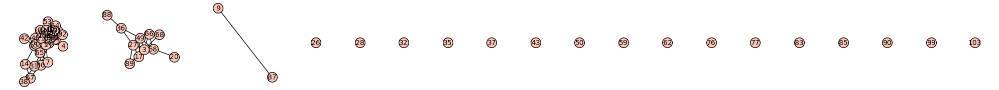

   order  max_degree avg_degree  clique_number  diameter
0     31          18       9.61              9         4
1     11           7       4.36              5         4

Percentage Total order of Large Components: 0.7

AP_Poll_2021_Week_2_agreement_graph


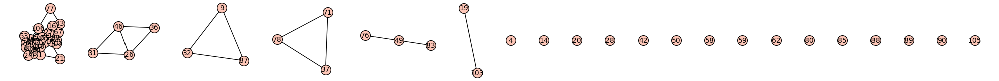

   order  max_degree avg_degree  clique_number  diameter
0     30          21       12.4             11         3

Percentage Total order of Large Components: 0.5

AP_Poll_2021_Week_3_agreement_graph


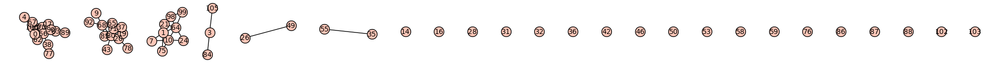

   order  max_degree avg_degree  clique_number  diameter
0     14           7       2.71              3         5
1     12           7       3.67              4         4
2      9           6       3.78              4         3

Percentage Total order of Large Components: 0.5833333333333334

AP_Poll_2021_Week_4_agreement_graph


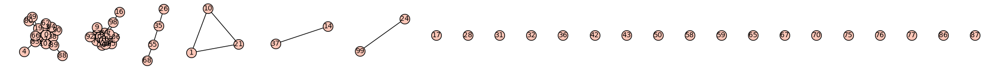

   order  max_degree avg_degree  clique_number  diameter
0     16          11       4.88              5         4
1     15           9       5.73              5         4

Percentage Total order of Large Components: 0.5166666666666667

AP_Poll_2021_Week_5_agreement_graph


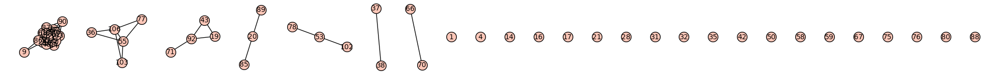

   order  max_degree avg_degree  clique_number  diameter
0     22          20      16.45             15         3
1      5           4        2.8              3         2

Percentage Total order of Large Components: 0.45

AP_Poll_2021_Week_6_agreement_graph


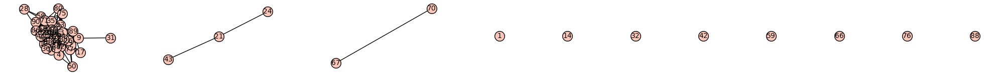

   order  max_degree avg_degree  clique_number  diameter
0     47          33      20.64             16         4

Percentage Total order of Large Components: 0.7833333333333333

AP_Poll_2021_Week_7_agreement_graph


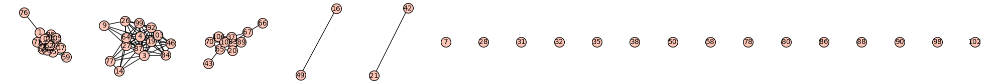

   order  max_degree avg_degree  clique_number  diameter
0     15          12      10.27             10         3
1     15          13        9.2              9         2
2     11           7       4.73              5         4

Percentage Total order of Large Components: 0.6833333333333333

AP_Poll_2021_Week_8_agreement_graph


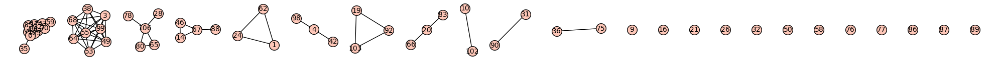

   order  max_degree avg_degree  clique_number  diameter
0     13          11       7.69              9         3
1      8           7       6.75              7         2
2      5           4        2.0              3         2

Percentage Total order of Large Components: 0.43333333333333335

AP_Poll_2021_Week_9_agreement_graph


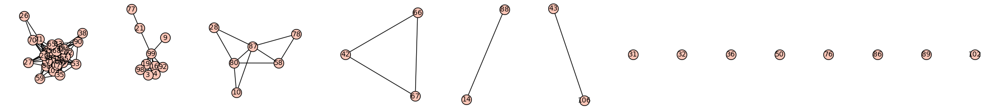

   order  max_degree avg_degree  clique_number  diameter
0     29          24      15.45             15         4
1     10           8        4.6              6         3
2      6           5        3.0              3         2

Percentage Total order of Large Components: 0.75

AP_Poll_2021_Week_10_agreement_graph


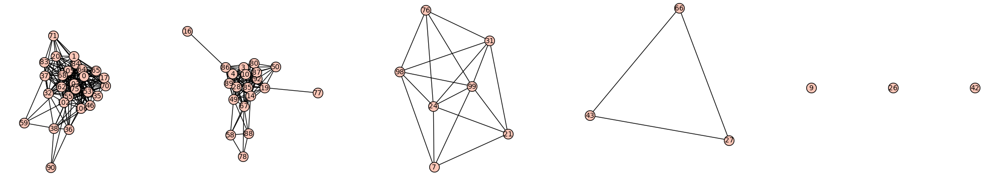

   order  max_degree avg_degree  clique_number  diameter
0     27          23      15.78             12         3
1     20          16       10.9             13         3
2      7           6       4.86              5         2

Percentage Total order of Large Components: 0.9

AP_Poll_2021_Week_11_agreement_graph


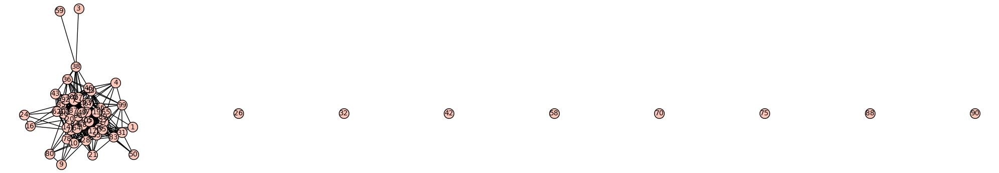

   order  max_degree avg_degree  clique_number  diameter
0     52          35      19.65             16         4

Percentage Total order of Large Components: 0.8666666666666667

AP_Poll_2021_Week_12_agreement_graph


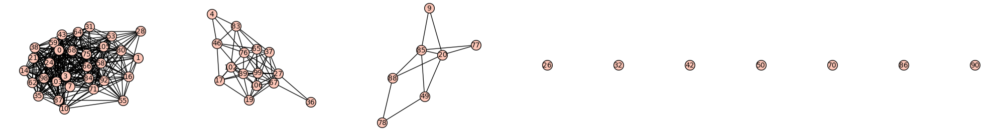

   order  max_degree avg_degree  clique_number  diameter
0     31          25      19.55             15         2
1     15          10       7.33              6         3
2      7           5       3.14              3         3

Percentage Total order of Large Components: 0.8833333333333333

AP_Poll_2021_Week_13_agreement_graph


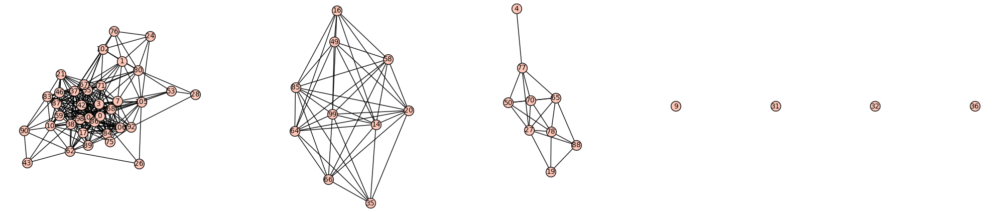

   order  max_degree avg_degree  clique_number  diameter
0     37          25      14.43             12         4
1     10           9        8.0              8         2
2      9           7       4.67              5         3

Percentage Total order of Large Components: 0.9333333333333333

AP_Poll_2021_Week_14_agreement_graph


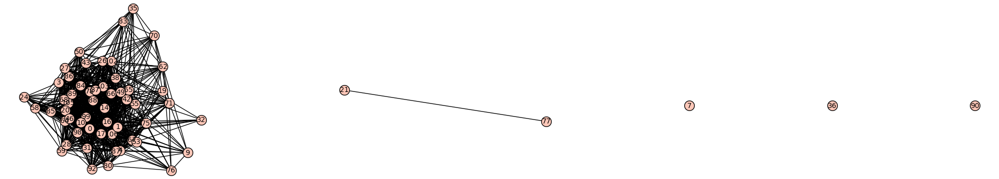

   order  max_degree avg_degree  clique_number  diameter
0     55          46      34.36             28         3

Percentage Total order of Large Components: 0.9166666666666666

AP_Poll_2021_Week_15_agreement_graph


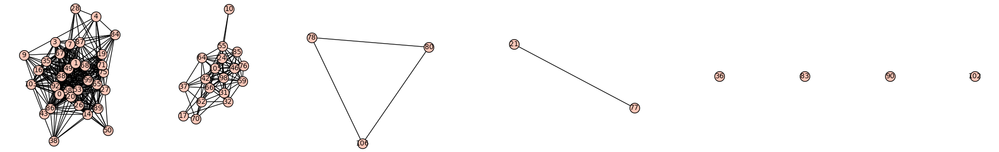

   order  max_degree avg_degree  clique_number  diameter
0     33          29      19.82             17         3
1     18          15       9.89              8         3

Percentage Total order of Large Components: 0.85

AP_Poll_2021_Final_agreement_graph


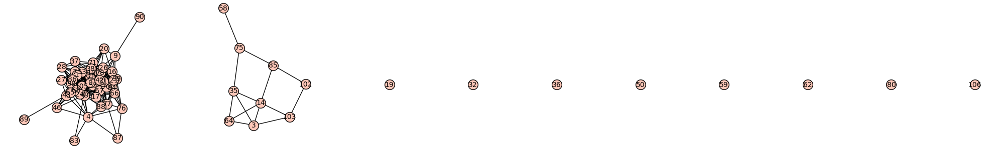

   order  max_degree avg_degree  clique_number  diameter
0     43          31      15.67             12         4
1      9           5       3.11              4         4

Percentage Total order of Large Components: 0.8666666666666667

AP_Poll_2022_Preseason_agreement_graph


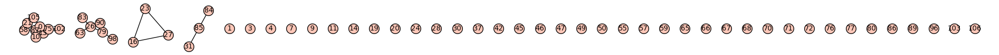

AP_Poll_2022_Week_2_agreement_graph


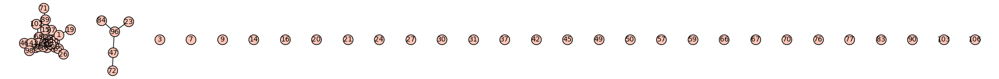

AP_Poll_2022_Week_3_agreement_graph


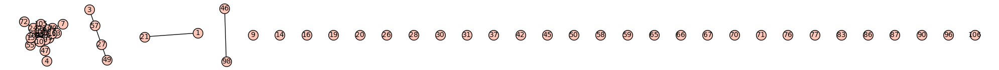

AP_Poll_2022_Week_4_agreement_graph


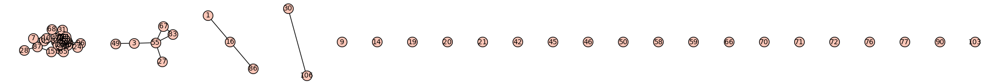

AP_Poll_2022_Week_5_agreement_graph


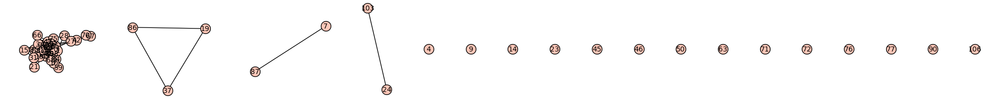

AP_Poll_2022_Week_6_agreement_graph


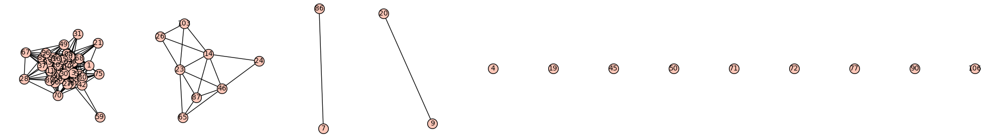

AP_Poll_2022_Week_7_agreement_graph


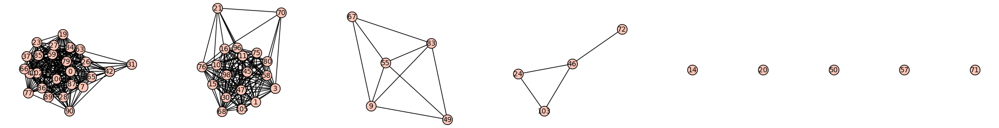

AP_Poll_2022_Week_8_agreement_graph


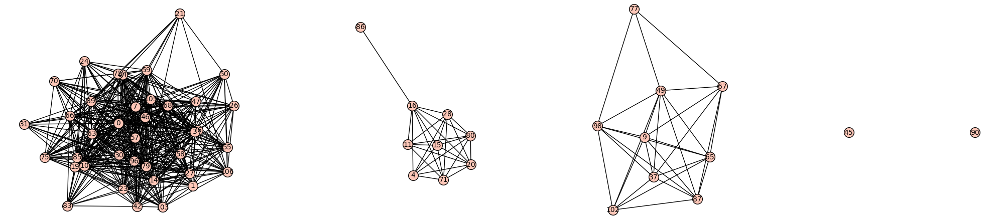

AP_Poll_2022_Week_9_agreement_graph


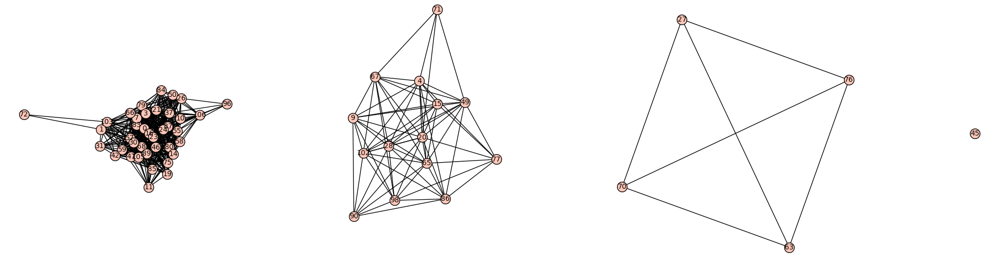

AP_Poll_2022_Week_10_agreement_graph


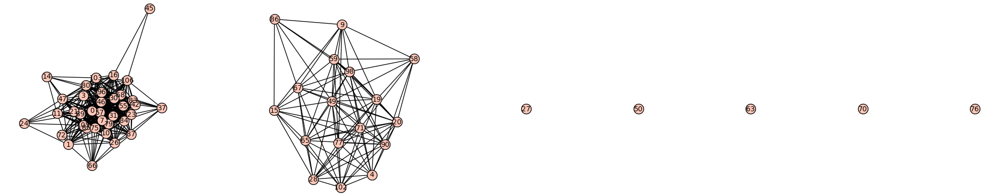

AP_Poll_2022_Week_11_agreement_graph


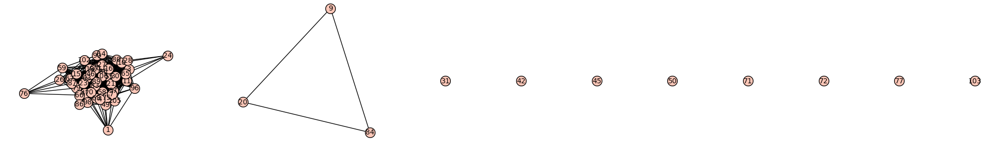

AP_Poll_2022_Week_12_agreement_graph


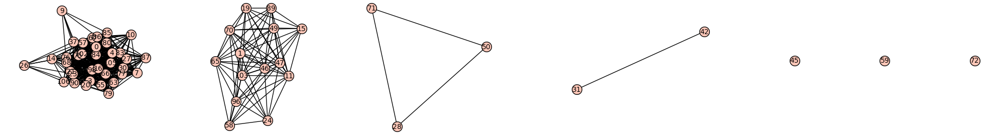

AP_Poll_2022_Week_13_agreement_graph


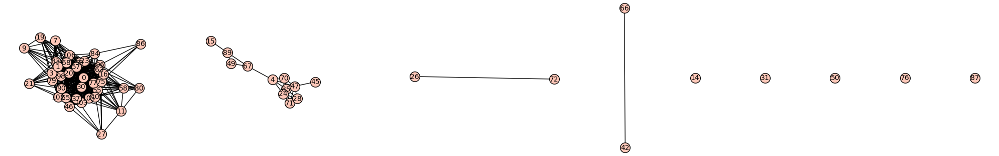

AP_Poll_2022_Week_14_agreement_graph


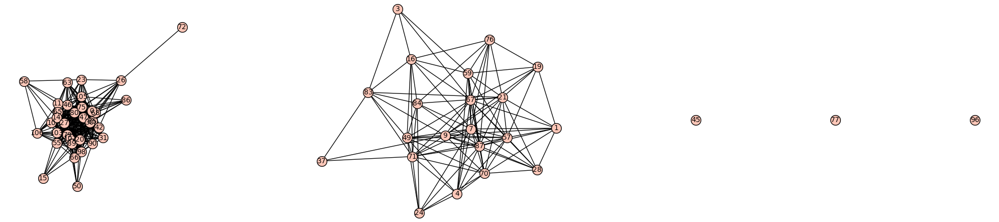

AP_Poll_2022_Week_15_agreement_graph


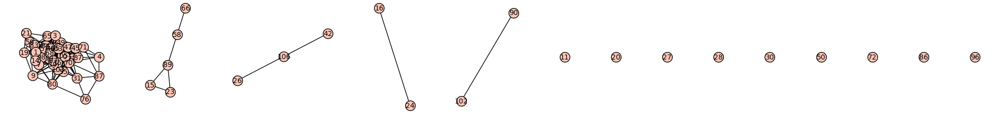

AP_Poll_2022_Final_agreement_graph


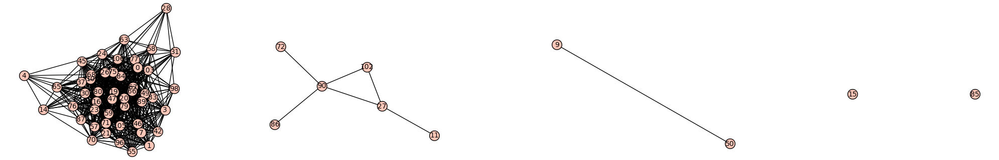

AP_Poll_2023_Preseason_agreement_graph


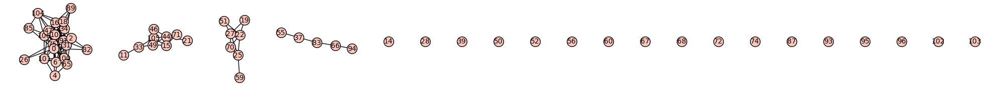

AP_Poll_2023_Week_2_agreement_graph


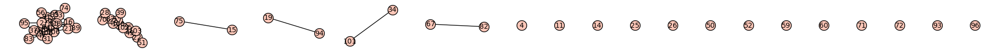

AP_Poll_2023_Week_3_agreement_graph


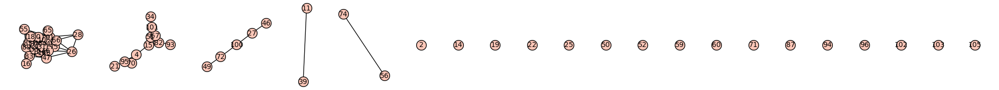

AP_Poll_2023_Week_4_agreement_graph


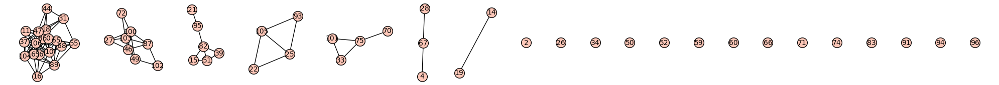

AP_Poll_2023_Week_5_agreement_graph


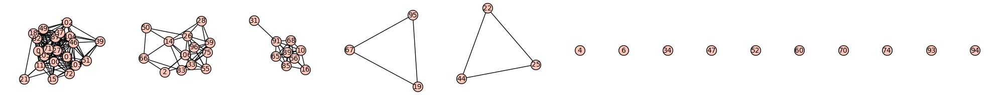

AP_Poll_2023_Week_6_agreement_graph


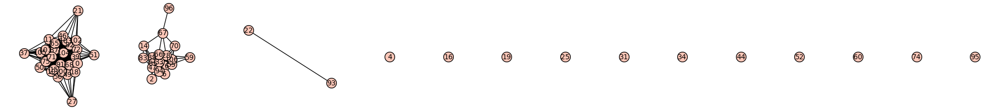

AP_Poll_2023_Week_7_agreement_graph


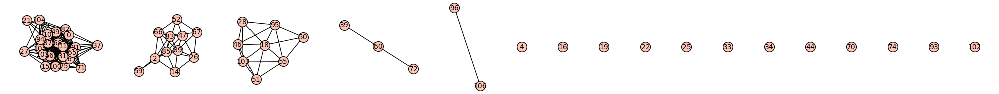

AP_Poll_2023_Week_8_agreement_graph


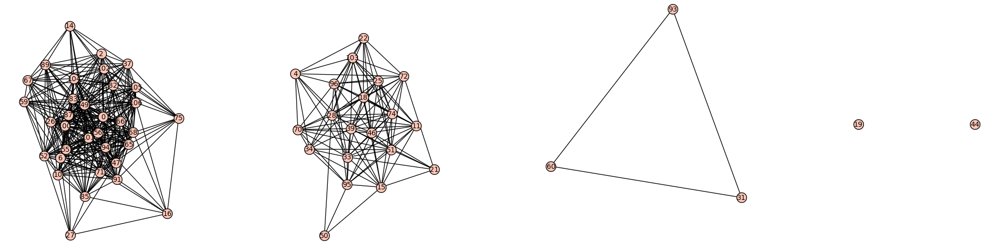

AP_Poll_2023_Week_9_agreement_graph


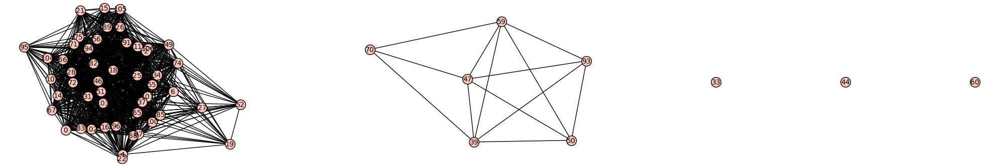

AP_Poll_2023_Week_10_agreement_graph


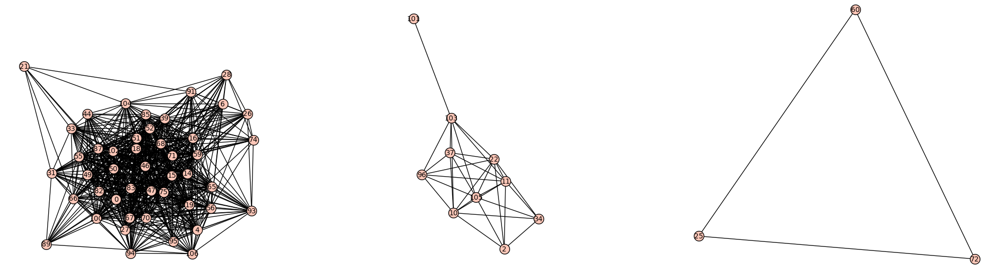

AP_Poll_2023_Week_11_agreement_graph


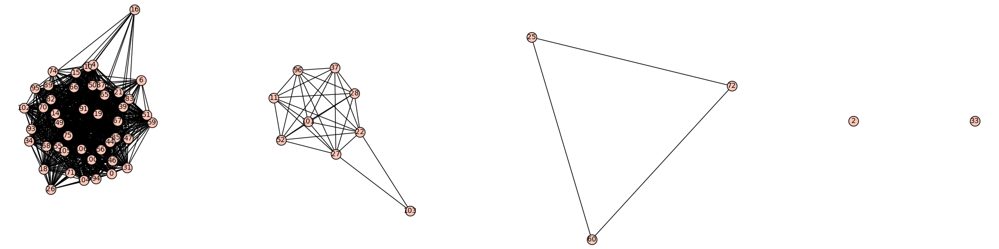

AP_Poll_2023_Week_12_agreement_graph


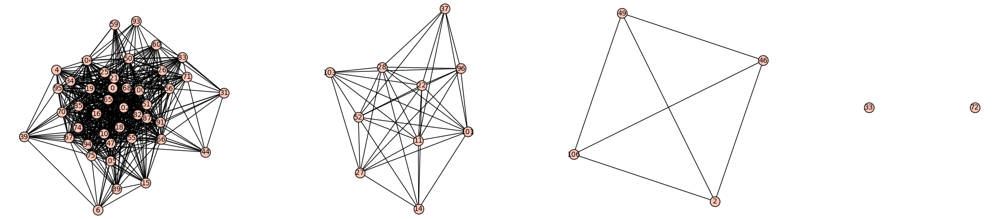

AP_Poll_2023_Week_13_agreement_graph


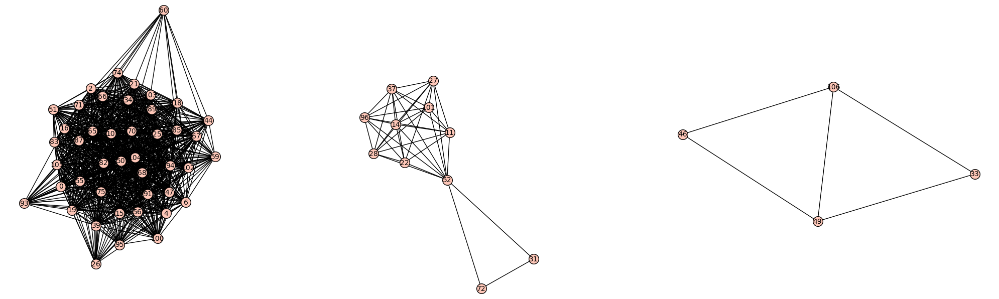

AP_Poll_2023_Week_14_agreement_graph


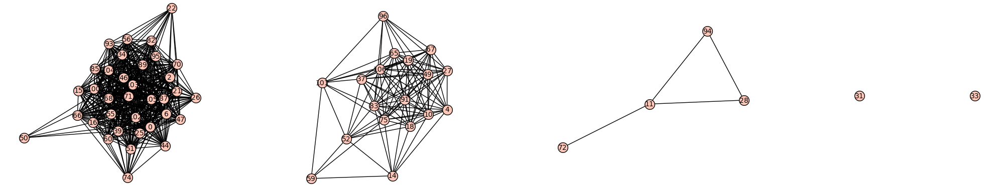

AP_Poll_2023_Week_15_agreement_graph


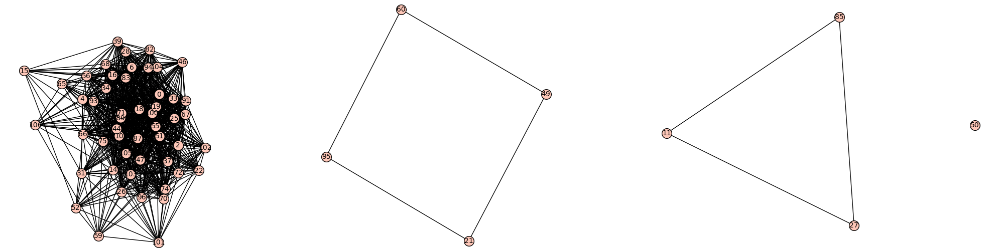

AP_Poll_2023_Final_agreement_graph


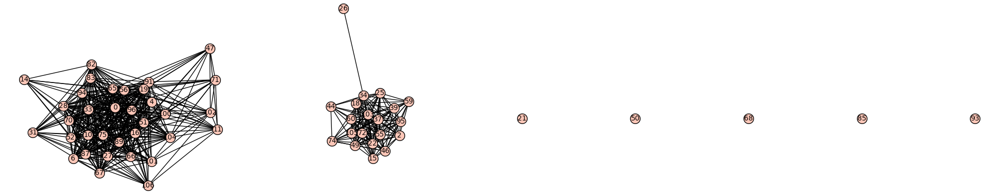

AP_Poll_2024_Preseason_agreement_graph


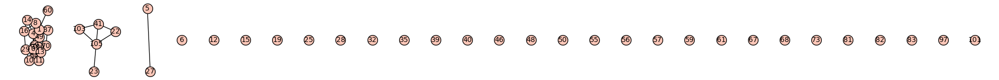

AP_Poll_2024_Week_2_agreement_graph


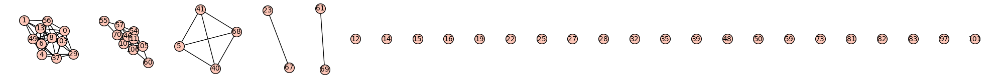

AP_Poll_2024_Week_3_agreement_graph


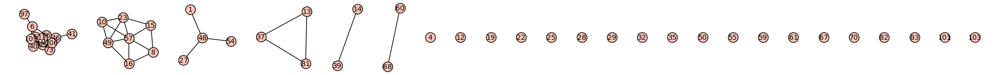

AP_Poll_2024_Week_4_agreement_graph


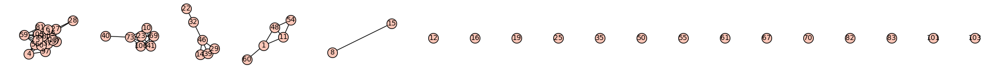

AP_Poll_2024_Week_5_agreement_graph


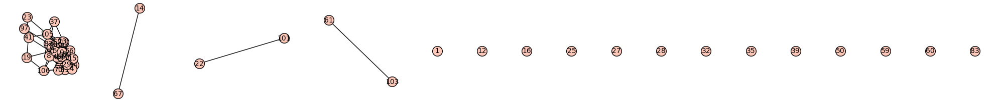

AP_Poll_2024_Week_6_agreement_graph


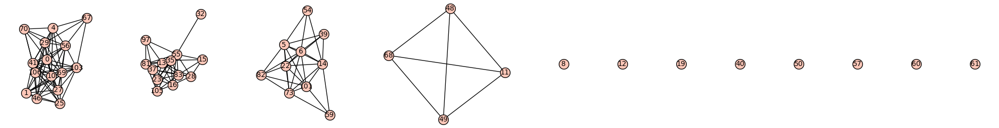

AP_Poll_2024_Week_7_agreement_graph


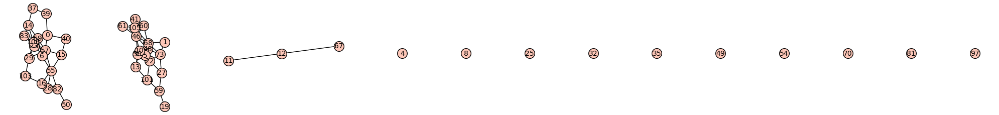

AP_Poll_2024_Week_8_agreement_graph


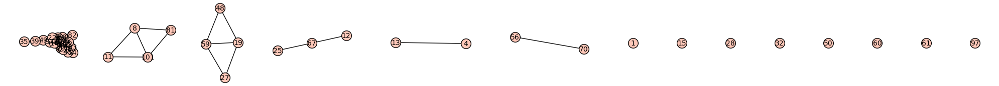

AP_Poll_2024_Week_9_agreement_graph


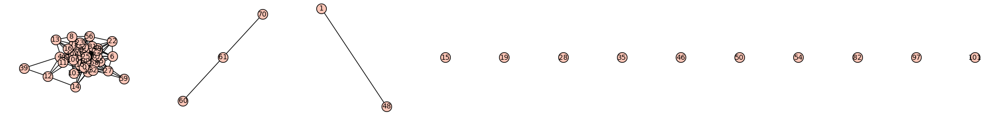

AP_Poll_2024_Week_10_agreement_graph


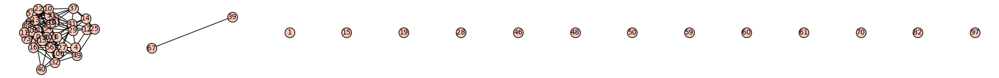

AP_Poll_2024_Week_11_agreement_graph


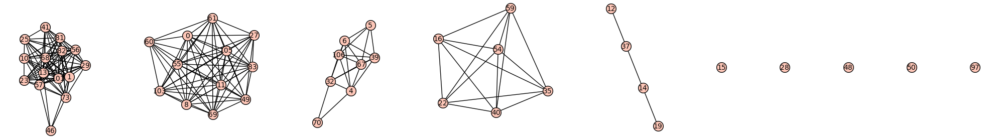

AP_Poll_2024_Week_12_agreement_graph


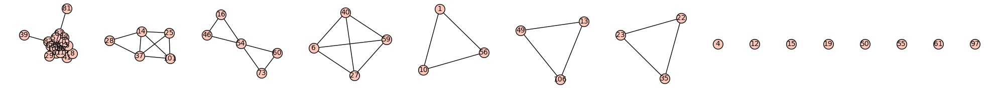

AP_Poll_2024_Week_13_agreement_graph


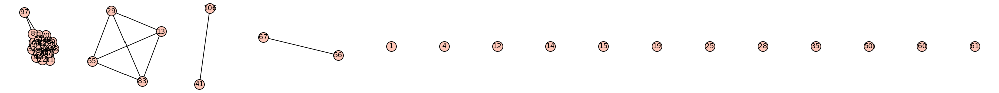

AP_Poll_2024_Week_14_agreement_graph


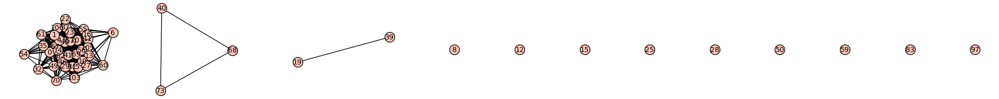

AP_Poll_2024_Week_15_agreement_graph


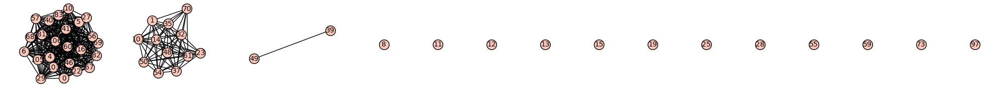

AP_Poll_2024_Week_16_agreement_graph


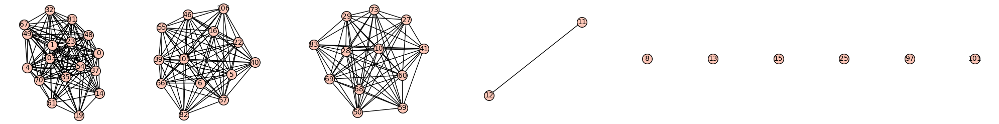

AP_Poll_2024_Final_agreement_graph


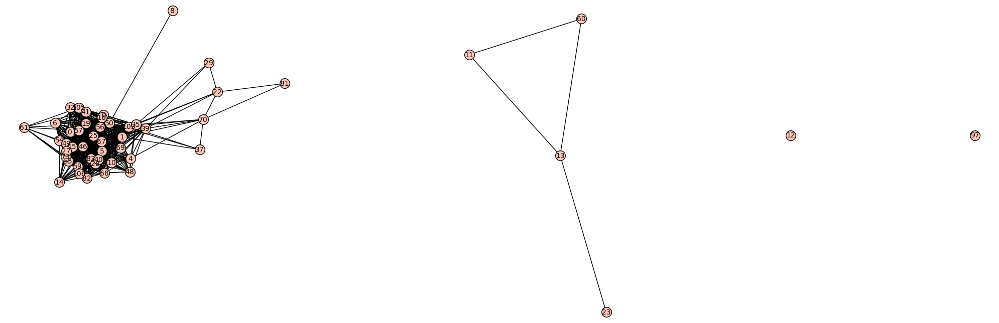

In [35]:
for name, graph in agreement_graphs_by_year[2021].items():
    print(f'AP_Poll_2021_{name}_agreement_graph')
    graph.show(figsize=20)
    print(agreement_metrics(graph))
    print("\nPercentage Total order of Large Components:",  agreement_metrics(graph)["order"].sum()/graph.order())
    print()
    
for name, graph in agreement_graphs_by_year[2022].items():
    print(f'AP_Poll_2022_{name}_agreement_graph')
    graph.show(figsize=20)
    
for name, graph in agreement_graphs_by_year[2023].items():
    print(f'AP_Poll_2023_{name}_agreement_graph')
    graph.show(figsize=20)
    
for name, graph in agreement_graphs_by_year[2024].items():
    print(f'AP_Poll_2024_{name}_agreement_graph')
    graph.show(figsize=20)

**Printing of agreement graph metrics.**

In [36]:
years = [2021, 2022, 2023, 2024]
for year in years:
    print(f"Printing Agreement Graph Metrics for {year}:")

    # Adjust weeks depending on year
    if year == 2024:
        weeks = ["Preseason"] + [f"Week_{i}" for i in range(2, 17)] + ["Final"]
    else:
        weeks = ["Preseason"] + [f"Week_{i}" for i in range(2, 16)] + ["Final"]
    
    for week in weeks:
        print(f"Components that have more than 5 vertices for {year} {week}")
        display(agreement_graphs_metrics_by_year[year][week])
    

Printing Agreement Graph Metrics for 2021:
Components that have more than 5 vertices for 2021 Preseason


,order,max_degree,avg_degree,clique_number,diameter
0,31,18,9.61,9,4
1,11,7,4.36,5,4


Components that have more than 5 vertices for 2021 Week_2


,order,max_degree,avg_degree,clique_number,diameter
0,30,21,12.4,11,3


Components that have more than 5 vertices for 2021 Week_3


,order,max_degree,avg_degree,clique_number,diameter
0,14,7,2.71,3,5
1,12,7,3.67,4,4
2,9,6,3.78,4,3


Components that have more than 5 vertices for 2021 Week_4


,order,max_degree,avg_degree,clique_number,diameter
0,16,11,4.88,5,4
1,15,9,5.73,5,4


Components that have more than 5 vertices for 2021 Week_5


,order,max_degree,avg_degree,clique_number,diameter
0,22,20,16.45,15,3
1,5,4,2.8,3,2


Components that have more than 5 vertices for 2021 Week_6


,order,max_degree,avg_degree,clique_number,diameter
0,47,33,20.64,16,4


Components that have more than 5 vertices for 2021 Week_7


,order,max_degree,avg_degree,clique_number,diameter
0,15,12,10.27,10,3
1,15,13,9.2,9,2
2,11,7,4.73,5,4


Components that have more than 5 vertices for 2021 Week_8


,order,max_degree,avg_degree,clique_number,diameter
0,13,11,7.69,9,3
1,8,7,6.75,7,2
2,5,4,2.0,3,2


Components that have more than 5 vertices for 2021 Week_9


,order,max_degree,avg_degree,clique_number,diameter
0,29,24,15.45,15,4
1,10,8,4.6,6,3
2,6,5,3.0,3,2


Components that have more than 5 vertices for 2021 Week_10


,order,max_degree,avg_degree,clique_number,diameter
0,27,23,15.78,12,3
1,20,16,10.9,13,3
2,7,6,4.86,5,2


Components that have more than 5 vertices for 2021 Week_11


,order,max_degree,avg_degree,clique_number,diameter
0,52,35,19.65,16,4


Components that have more than 5 vertices for 2021 Week_12


,order,max_degree,avg_degree,clique_number,diameter
0,31,25,19.55,15,2
1,15,10,7.33,6,3
2,7,5,3.14,3,3


Components that have more than 5 vertices for 2021 Week_13


,order,max_degree,avg_degree,clique_number,diameter
0,37,25,14.43,12,4
1,10,9,8.0,8,2
2,9,7,4.67,5,3


Components that have more than 5 vertices for 2021 Week_14


,order,max_degree,avg_degree,clique_number,diameter
0,55,46,34.36,28,3


Components that have more than 5 vertices for 2021 Week_15


,order,max_degree,avg_degree,clique_number,diameter
0,33,29,19.82,17,3
1,18,15,9.89,8,3


Components that have more than 5 vertices for 2021 Final


,order,max_degree,avg_degree,clique_number,diameter
0,43,31,15.67,12,4
1,9,5,3.11,4,4


Printing Agreement Graph Metrics for 2022:
Components that have more than 5 vertices for 2022 Preseason


,order,max_degree,avg_degree,clique_number,diameter
0,9,6,3.11,4,3
1,6,4,2.0,3,3


Components that have more than 5 vertices for 2022 Week_2


,order,max_degree,avg_degree,clique_number,diameter
0,26,12,5.69,6,5
1,5,3,1.6,2,3


Components that have more than 5 vertices for 2022 Week_3


,order,max_degree,avg_degree,clique_number,diameter
0,22,11,5.18,5,5


Components that have more than 5 vertices for 2022 Week_4


,order,max_degree,avg_degree,clique_number,diameter
0,28,17,10.21,10,5
1,6,4,2.0,3,3


Components that have more than 5 vertices for 2022 Week_5


,order,max_degree,avg_degree,clique_number,diameter
0,37,21,11.08,10,5


Components that have more than 5 vertices for 2022 Week_6


,order,max_degree,avg_degree,clique_number,diameter
0,37,31,21.78,20,3
1,8,6,4.0,4,2


Components that have more than 5 vertices for 2022 Week_7


,order,max_degree,avg_degree,clique_number,diameter
0,25,24,18.88,16,2
1,19,18,15.16,15,2
2,5,4,3.6,4,2


Components that have more than 5 vertices for 2022 Week_8


,order,max_degree,avg_degree,clique_number,diameter
0,38,36,25.58,20,2
1,9,8,6.22,7,2
2,9,8,6.44,7,2


Components that have more than 5 vertices for 2022 Week_9


,order,max_degree,avg_degree,clique_number,diameter
0,39,36,25.59,20,4
1,14,13,9.57,9,2


Components that have more than 5 vertices for 2022 Week_10


,order,max_degree,avg_degree,clique_number,diameter
0,36,31,22.28,18,3
1,17,16,11.06,8,2


Components that have more than 5 vertices for 2022 Week_11


,order,max_degree,avg_degree,clique_number,diameter
0,47,41,32.26,26,3


Components that have more than 5 vertices for 2022 Week_12


,order,max_degree,avg_degree,clique_number,diameter
0,36,33,25.89,23,3
1,14,13,10.71,10,2


Components that have more than 5 vertices for 2022 Week_13


,order,max_degree,avg_degree,clique_number,diameter
0,37,32,23.89,23,3
1,12,7,3.83,5,5


Components that have more than 5 vertices for 2022 Week_14


,order,max_degree,avg_degree,clique_number,diameter
0,34,28,20.59,20,4
1,21,16,10.29,9,3


Components that have more than 5 vertices for 2022 Week_15


,order,max_degree,avg_degree,clique_number,diameter
0,37,25,15.19,14,3
1,5,3,2.0,3,3


Components that have more than 5 vertices for 2022 Final


,order,max_degree,avg_degree,clique_number,diameter
0,48,40,29.21,23,3
1,6,4,2.0,3,3


Printing Agreement Graph Metrics for 2023:
Components that have more than 5 vertices for 2023 Preseason


,order,max_degree,avg_degree,clique_number,diameter
0,21,18,9.14,8,3
1,9,6,3.33,4,4
2,7,5,3.14,4,3
3,5,2,1.6,2,4


Components that have more than 5 vertices for 2023 Week_2


,order,max_degree,avg_degree,clique_number,diameter
0,25,16,9.04,9,4
1,13,5,2.62,4,6


Components that have more than 5 vertices for 2023 Week_3


,order,max_degree,avg_degree,clique_number,diameter
0,23,19,14.0,13,3
1,11,4,2.55,3,6
2,5,2,1.6,2,4


Components that have more than 5 vertices for 2023 Week_4


,order,max_degree,avg_degree,clique_number,diameter
0,18,13,9.11,7,3
1,8,6,4.0,4,3
2,6,4,2.33,3,3


Components that have more than 5 vertices for 2023 Week_5


,order,max_degree,avg_degree,clique_number,diameter
0,21,18,14.57,14,2
1,13,9,6.15,5,3
2,9,7,5.78,7,3


Components that have more than 5 vertices for 2023 Week_6


,order,max_degree,avg_degree,clique_number,diameter
0,28,25,21.07,21,3
1,18,13,8.44,9,3


Components that have more than 5 vertices for 2023 Week_7


,order,max_degree,avg_degree,clique_number,diameter
0,23,21,16.52,15,3
1,11,9,5.45,5,3
2,8,7,4.75,4,2


Components that have more than 5 vertices for 2023 Week_8


,order,max_degree,avg_degree,clique_number,diameter
0,34,29,20.82,16,3
1,20,16,11.4,8,2


Components that have more than 5 vertices for 2023 Week_9


,order,max_degree,avg_degree,clique_number,diameter
0,50,47,40.96,37,2
1,6,5,4.33,5,2


Components that have more than 5 vertices for 2023 Week_10


,order,max_degree,avg_degree,clique_number,diameter
0,46,41,31.17,26,3
1,10,8,6.2,7,3


Components that have more than 5 vertices for 2023 Week_11


,order,max_degree,avg_degree,clique_number,diameter
0,45,43,39.24,36,3
1,9,8,6.67,8,2


Components that have more than 5 vertices for 2023 Week_12


,order,max_degree,avg_degree,clique_number,diameter
0,43,37,27.91,24,2
1,10,9,8.0,8,2


Components that have more than 5 vertices for 2023 Week_13


,order,max_degree,avg_degree,clique_number,diameter
0,44,42,37.64,32,2
1,11,10,6.91,8,2


Components that have more than 5 vertices for 2023 Week_14


,order,max_degree,avg_degree,clique_number,diameter
0,35,32,28.63,25,3
1,18,16,12.22,12,2


Components that have more than 5 vertices for 2023 Week_15


,order,max_degree,avg_degree,clique_number,diameter
0,51,45,34.67,27,3


Components that have more than 5 vertices for 2023 Final


,order,max_degree,avg_degree,clique_number,diameter
0,34,33,24.88,24,2
1,20,18,14.7,14,3


Printing Agreement Graph Metrics for 2024:
Components that have more than 5 vertices for 2024 Preseason


,order,max_degree,avg_degree,clique_number,diameter
0,17,11,6.94,6,3
1,5,4,2.4,3,2


Components that have more than 5 vertices for 2024 Week_2


,order,max_degree,avg_degree,clique_number,diameter
0,11,10,7.64,7,2
1,10,7,5.8,6,3


Components that have more than 5 vertices for 2024 Week_3


,order,max_degree,avg_degree,clique_number,diameter
0,13,9,5.69,6,4
1,7,6,3.71,4,2


Components that have more than 5 vertices for 2024 Week_4


,order,max_degree,avg_degree,clique_number,diameter
0,16,14,10.88,10,3
1,7,6,4.57,6,2
2,6,4,2.67,4,3
3,5,3,2.4,3,3


Components that have more than 5 vertices for 2024 Week_5


,order,max_degree,avg_degree,clique_number,diameter
0,31,24,13.16,13,3


Components that have more than 5 vertices for 2024 Week_6


,order,max_degree,avg_degree,clique_number,diameter
0,15,13,9.87,8,2
1,13,12,7.08,6,2
2,10,8,6.0,6,2


Components that have more than 5 vertices for 2024 Week_7


,order,max_degree,avg_degree,clique_number,diameter
0,19,8,4.11,5,6
1,18,10,4.78,6,6


Components that have more than 5 vertices for 2024 Week_8


,order,max_degree,avg_degree,clique_number,diameter
0,27,15,10.59,8,5


Components that have more than 5 vertices for 2024 Week_9


,order,max_degree,avg_degree,clique_number,diameter
0,35,24,14.51,12,4


Components that have more than 5 vertices for 2024 Week_10


,order,max_degree,avg_degree,clique_number,diameter
0,35,19,10.74,7,3


Components that have more than 5 vertices for 2024 Week_11


,order,max_degree,avg_degree,clique_number,diameter
0,15,14,11.73,11,2
1,12,11,10.5,11,2
2,8,6,5.25,6,3
3,6,5,5.0,6,1


Components that have more than 5 vertices for 2024 Week_12


,order,max_degree,avg_degree,clique_number,diameter
0,19,16,11.26,12,3
1,5,4,3.2,4,2
2,5,4,2.4,3,2


Components that have more than 5 vertices for 2024 Week_13


,order,max_degree,avg_degree,clique_number,diameter
0,30,28,23.47,21,3


Components that have more than 5 vertices for 2024 Week_14


,order,max_degree,avg_degree,clique_number,diameter
0,36,33,26.72,22,2


Components that have more than 5 vertices for 2024 Week_15


,order,max_degree,avg_degree,clique_number,diameter
0,24,23,22.92,23,2
1,12,11,10.33,10,2


Components that have more than 5 vertices for 2024 Week_16


,order,max_degree,avg_degree,clique_number,diameter
0,17,16,14.71,14,2
1,13,12,11.85,12,2
2,12,11,10.67,11,2


Components that have more than 5 vertices for 2024 Final


,order,max_degree,avg_degree,clique_number,diameter
0,44,36,26.18,25,4


**Average Degree and Clique Number Differential Metric Calculations**

In [37]:
print('Average degree and Clique Number differentials over all large components of each season:')
print()

print("2021 Season")
print(sum(list(avg_deg_clique_differential_large_components_by_year[2021].values())[:])/35)
print()

print("2022 Season")
print(sum(list(avg_deg_clique_differential_large_components_by_year[2022].values())[:])/31)
print()

print("2023 Season")
print(sum(list(avg_deg_clique_differential_large_components_by_year[2023].values())[:])/37)
print()

print("2024 Season")
print(sum(list(avg_deg_clique_differential_large_components_by_year[2024].values())[:])/34)

Average degree and Clique Number differentials over all large components of each season:

2021 Season
0.8822857142857143

2022 Season
1.1899999999999997

2023 Season
1.1227027027027028

2024 Season
0.37441176470588244


**Diameter Metric Calculations**

In [38]:
print('Average Diameter over all large components of each season:')
print()

print("2021 Season")
print(sum(list(diameter_in_large_components_by_year[2021].values())[:])/35)
print()

print("2022 Season")
print(sum(list(diameter_in_large_components_by_year[2022].values())[:])/31)
print()

print("2023 Season")
print(sum(list(diameter_in_large_components_by_year[2023].values())[:])/37)
print()

print("2024 Season")
print(sum(list(diameter_in_large_components_by_year[2024].values())[:])/34)

Average Diameter over all large components of each season:

2021 Season
3.1714285714285713

2022 Season
3.064516129032258

2023 Season
2.945945945945946

2024 Season
2.764705882352941


The below are the averages of the percent of vertices contained in components with at least 5 vertices after week 6
0.8083333333333333
0.8758620689655172
0.8949152542372882
0.7127272727272725


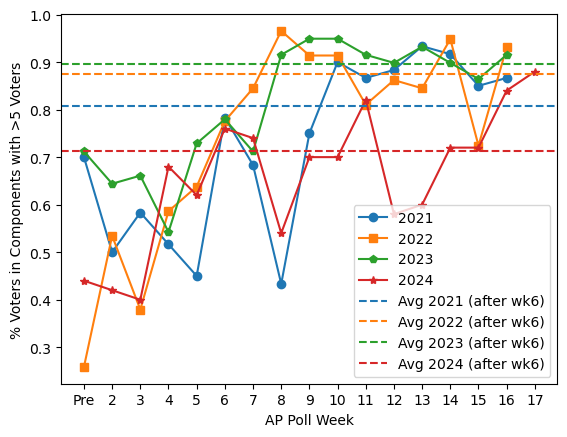

In [39]:
print('The below are the averages of the percent of vertices contained in components with at least 5 vertices after week 6')
plt.plot(["Pre", 2,3,4,5,6,7,8,9,10,11,12,13,14,15,16], list(percent_voters_in_large_components_by_year[2021].values()), color='#1f77b4', marker="o", label="2021")
print(sum(list(percent_voters_in_large_components_by_year[2021].values())[6:])/len(list(percent_voters_in_large_components_by_year[2021].values())[6:]))

plt.plot(["Pre", 2,3,4,5,6,7,8,9,10,11,12,13,14,15,16], list(percent_voters_in_large_components_by_year[2022].values()), color='#ff7f0e', marker="s", label="2022")
print(sum(list(percent_voters_in_large_components_by_year[2022].values())[6:])/len(list(percent_voters_in_large_components_by_year[2022].values())[6:]))

plt.plot(["Pre", 2,3,4,5,6,7,8,9,10,11,12,13,14,15,16], list(percent_voters_in_large_components_by_year[2023].values()), color='#2ca02c', marker="p", label="2023")
print(sum(list(percent_voters_in_large_components_by_year[2023].values())[6:])/len(list(percent_voters_in_large_components_by_year[2023].values())[6:]))


plt.plot(["Pre", 2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17], list(percent_voters_in_large_components_by_year[2024].values()), color='#d62728', marker="*", label="2024")
print(sum(list(percent_voters_in_large_components_by_year[2024].values())[6:])/len(list(percent_voters_in_large_components_by_year[2024].values())[6:]))
plt.xlabel("AP Poll Week")
plt.ylabel("% Voters in Components with >5 Voters")
plt.axhline(y=.8083, color='#1f77b4', linestyle='--', label='Avg 2021 (after wk6)')
plt.axhline(y=.8758, color='#ff7f0e', linestyle='--', label='Avg 2022 (after wk6)')
plt.axhline(y=.8949, color='#2ca02c', linestyle='--', label='Avg 2023 (after wk6)')
plt.axhline(y=.7127, color='#d62728', linestyle='--', label='Avg 2024 (after wk6)')
# plt.axhline(y=.726, color='#1f77b4', linestyle='--', label='Avg 2021')
# plt.axhline(y=.7456, color='#ff7f0e', linestyle='--', label='Avg 2022')
# plt.axhline(y=.8135, color='#2ca02c', linestyle='--', label='Avg 2023')
# plt.axhline(y=.6564, color='#d62728', linestyle='--', label='Avg 2024')
plt.legend()
plt.show()

**Below we print labeled graphs representing the domination graphs of each week of the 2021, 2022, 2023, and 2024 seasons.**

AP_Poll_2021_Week_2_domination_graph


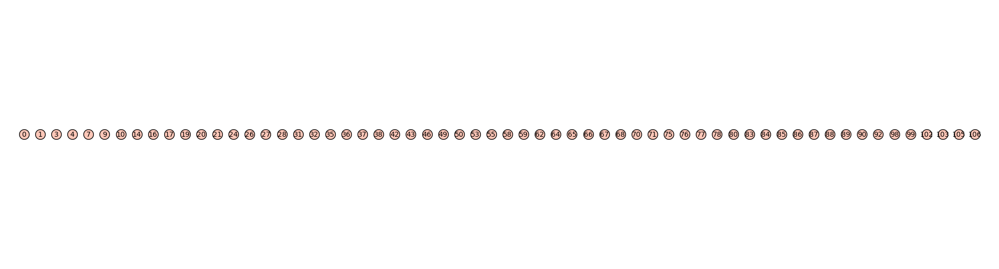

AP_Poll_2021_Week_3_domination_graph


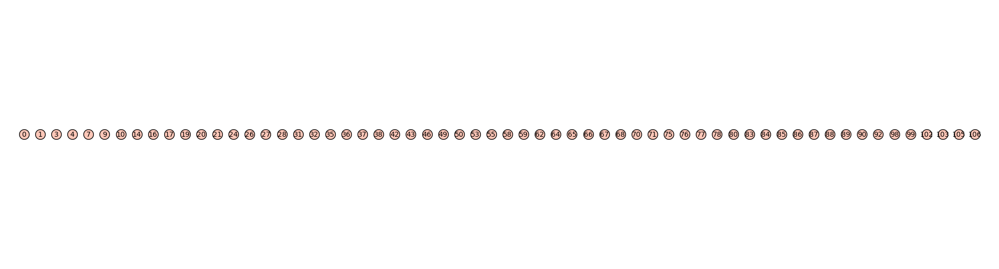

AP_Poll_2021_Week_4_domination_graph


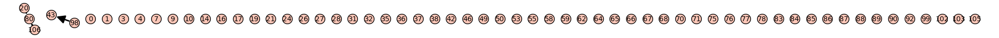

AP_Poll_2021_Week_5_domination_graph


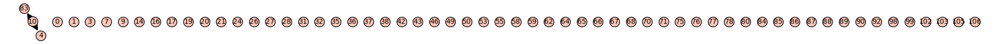

AP_Poll_2021_Week_6_domination_graph


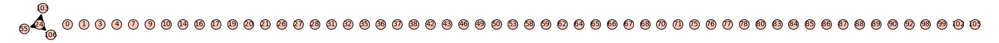

AP_Poll_2021_Week_7_domination_graph


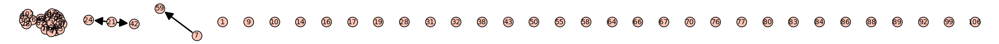

AP_Poll_2021_Week_8_domination_graph


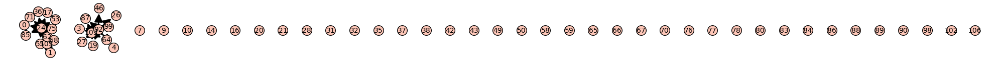

AP_Poll_2021_Week_9_domination_graph


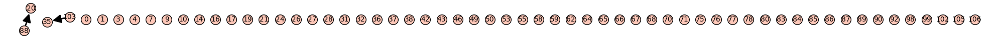

AP_Poll_2021_Week_10_domination_graph


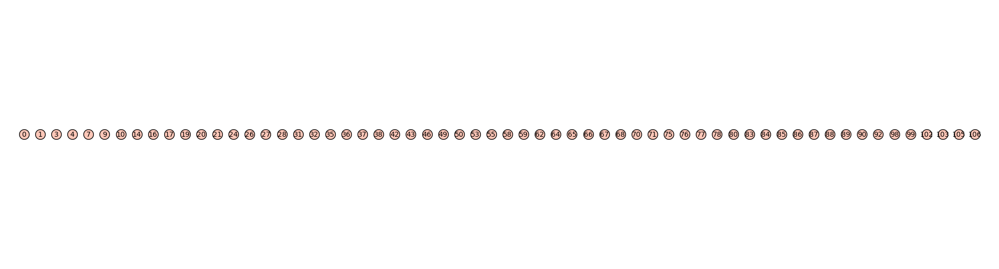

AP_Poll_2021_Week_11_domination_graph


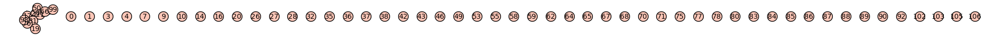

AP_Poll_2021_Week_12_domination_graph


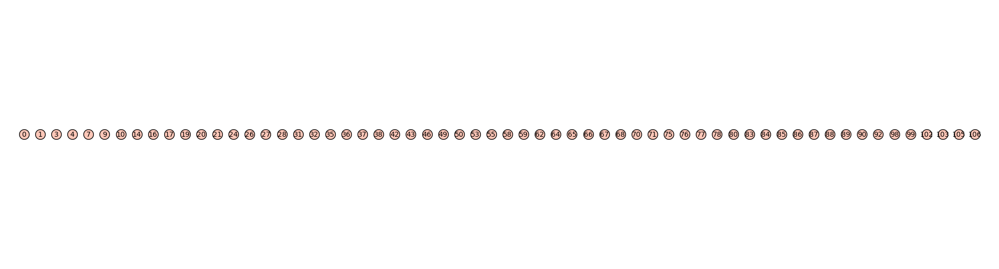

AP_Poll_2021_Week_13_domination_graph


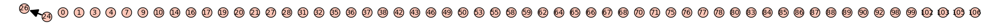

AP_Poll_2021_Week_14_domination_graph


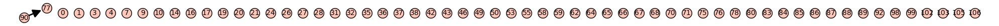

AP_Poll_2021_Week_15_domination_graph


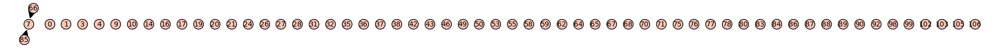

AP_Poll_2021_Final_domination_graph


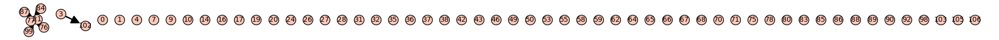

AP_Poll_2022_Week_2_domination_graph


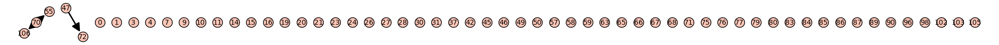

AP_Poll_2022_Week_3_domination_graph


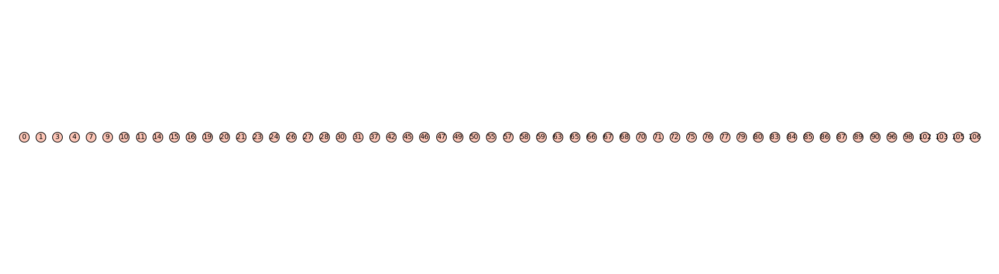

AP_Poll_2022_Week_4_domination_graph


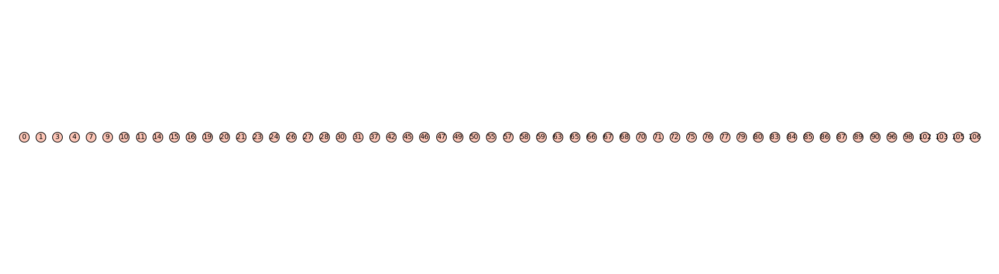

AP_Poll_2022_Week_5_domination_graph


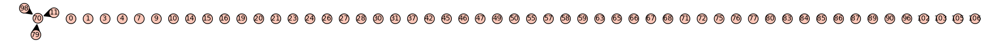

AP_Poll_2022_Week_6_domination_graph


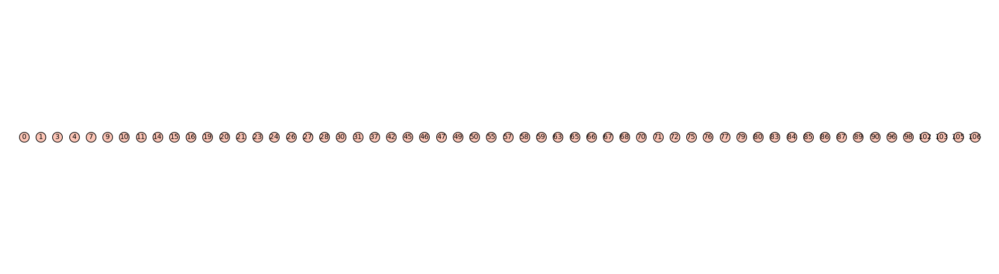

AP_Poll_2022_Week_7_domination_graph


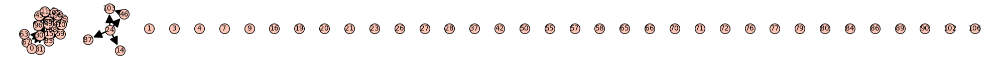

AP_Poll_2022_Week_8_domination_graph


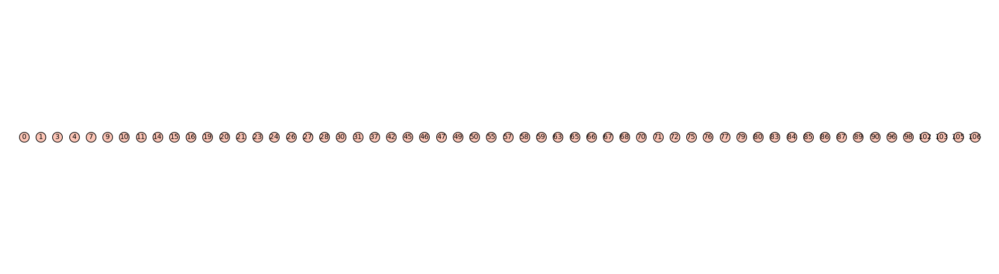

AP_Poll_2022_Week_9_domination_graph


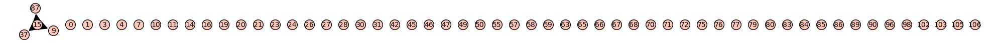

AP_Poll_2022_Week_10_domination_graph


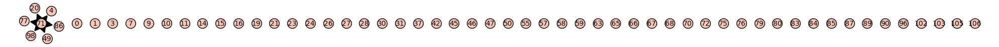

AP_Poll_2022_Week_11_domination_graph


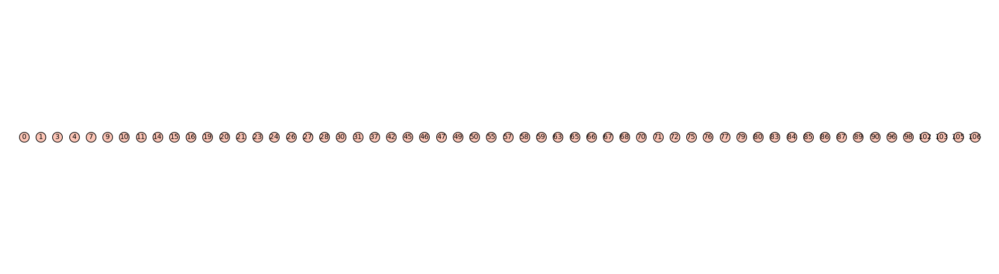

AP_Poll_2022_Week_12_domination_graph


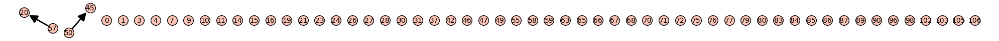

AP_Poll_2022_Week_13_domination_graph


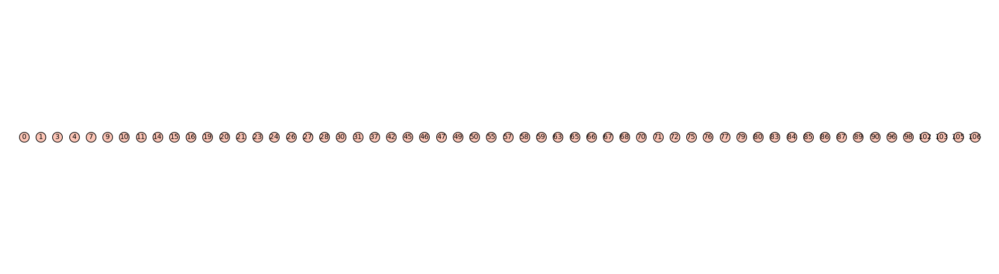

AP_Poll_2022_Week_14_domination_graph


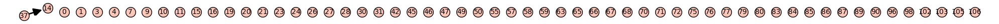

AP_Poll_2022_Week_15_domination_graph


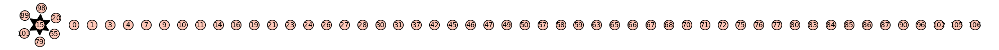

AP_Poll_2022_Final_domination_graph


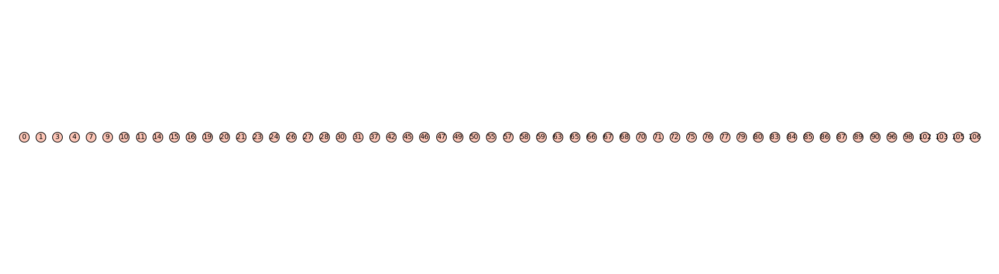

AP_Poll_2023_Week_2_domination_graph


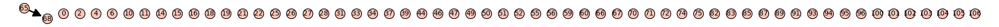

AP_Poll_2023_Week_3_domination_graph


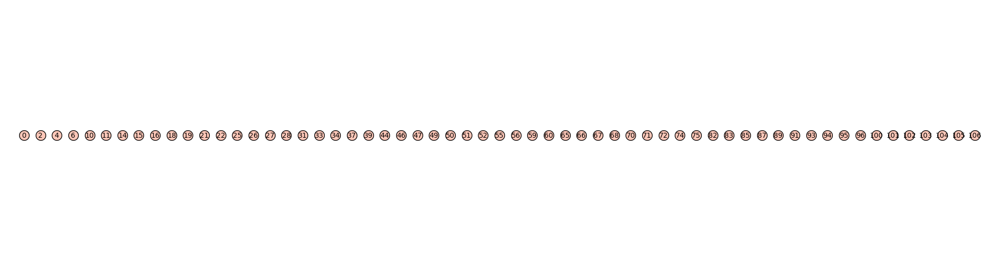

AP_Poll_2023_Week_4_domination_graph


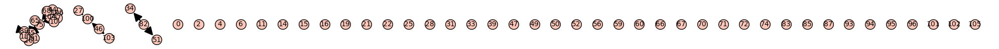

AP_Poll_2023_Week_5_domination_graph


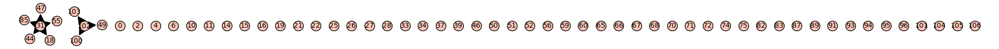

AP_Poll_2023_Week_6_domination_graph


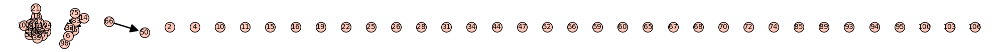

AP_Poll_2023_Week_7_domination_graph


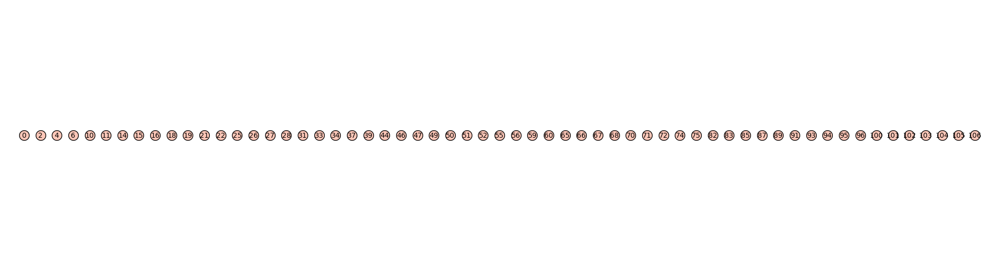

AP_Poll_2023_Week_8_domination_graph


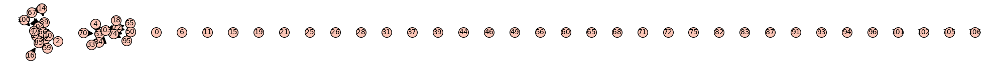

AP_Poll_2023_Week_9_domination_graph


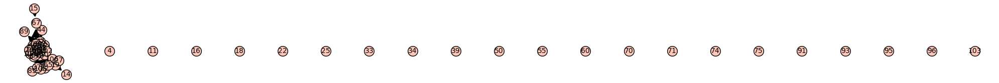

AP_Poll_2023_Week_10_domination_graph


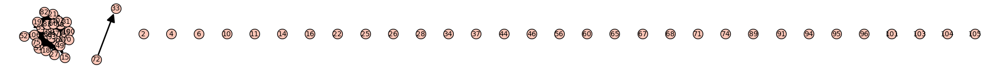

AP_Poll_2023_Week_11_domination_graph


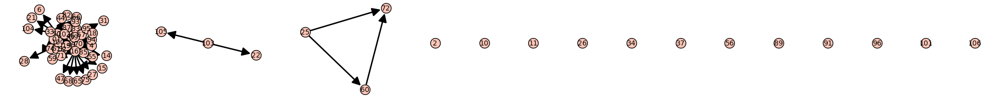

AP_Poll_2023_Week_12_domination_graph


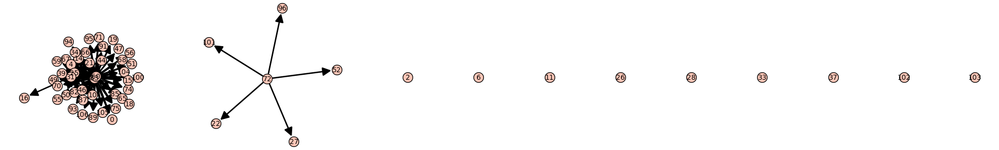

AP_Poll_2023_Week_13_domination_graph


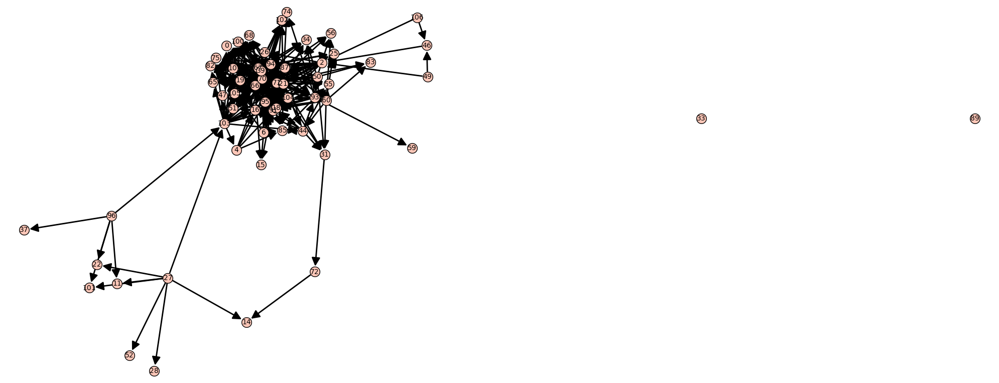

AP_Poll_2023_Week_14_domination_graph


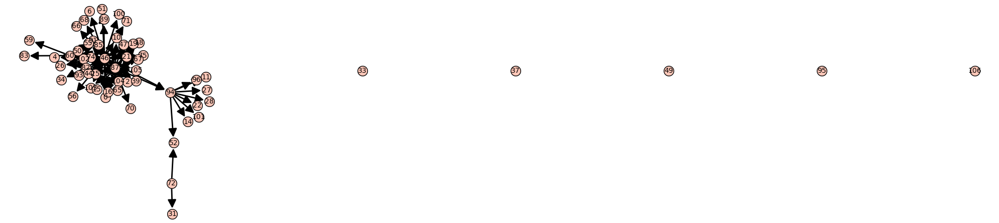

AP_Poll_2023_Week_15_domination_graph


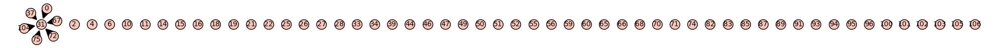

AP_Poll_2023_Final_domination_graph


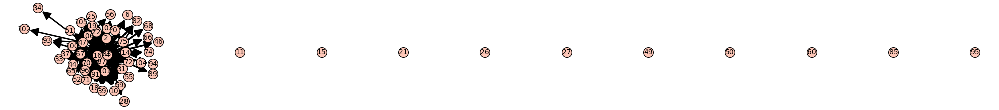

AP_Poll_2024_Week_2_domination_graph


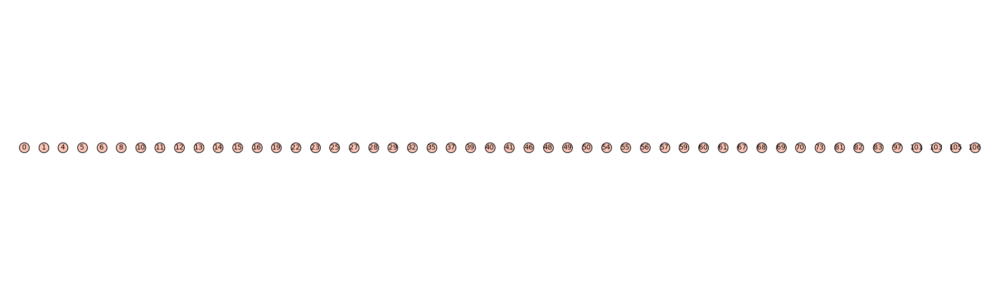

AP_Poll_2024_Week_3_domination_graph


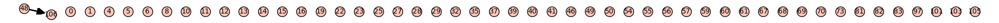

AP_Poll_2024_Week_4_domination_graph


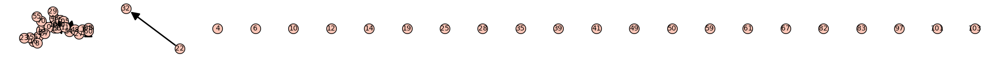

AP_Poll_2024_Week_5_domination_graph


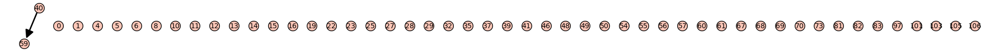

AP_Poll_2024_Week_6_domination_graph


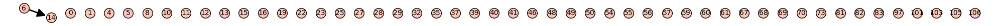

AP_Poll_2024_Week_7_domination_graph


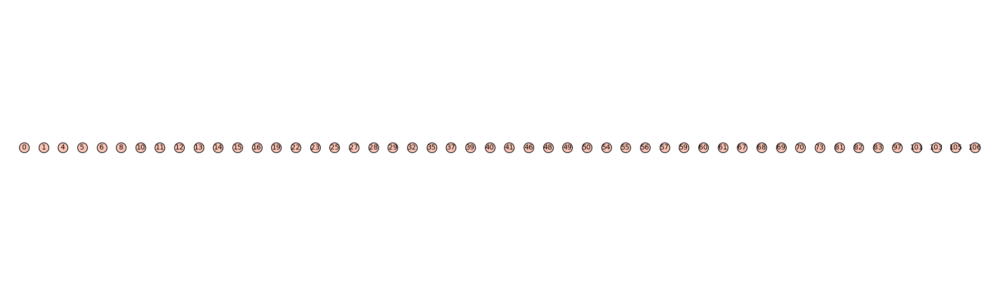

AP_Poll_2024_Week_8_domination_graph


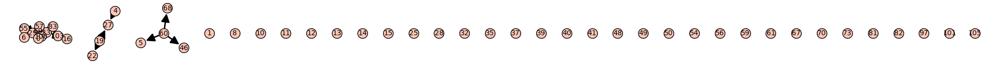

AP_Poll_2024_Week_9_domination_graph


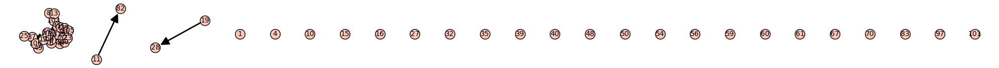

AP_Poll_2024_Week_10_domination_graph


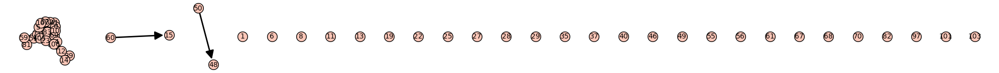

AP_Poll_2024_Week_11_domination_graph


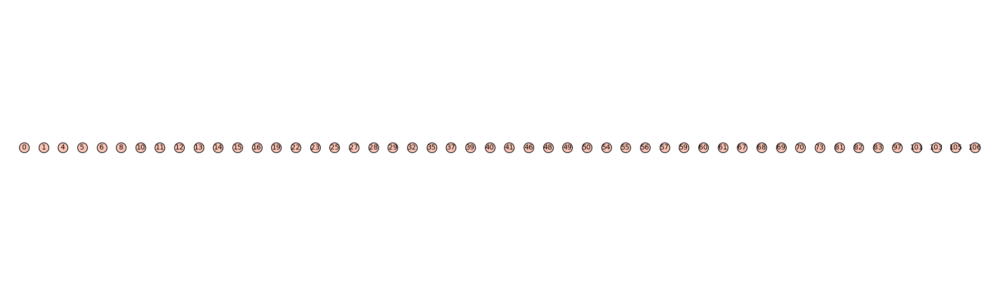

AP_Poll_2024_Week_12_domination_graph


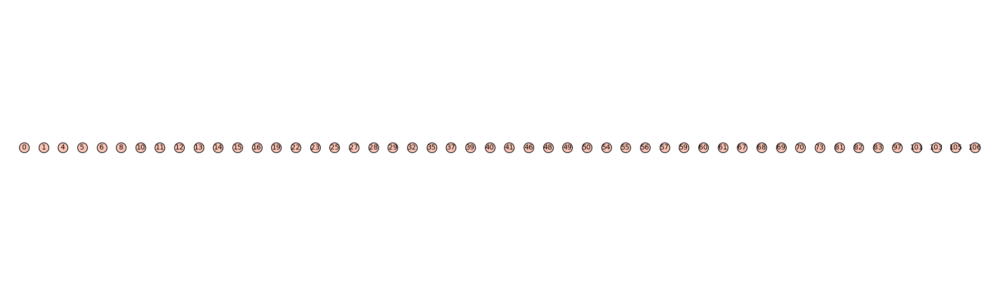

AP_Poll_2024_Week_13_domination_graph


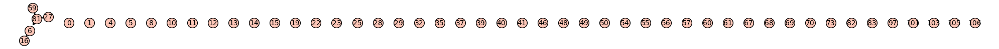

AP_Poll_2024_Week_14_domination_graph


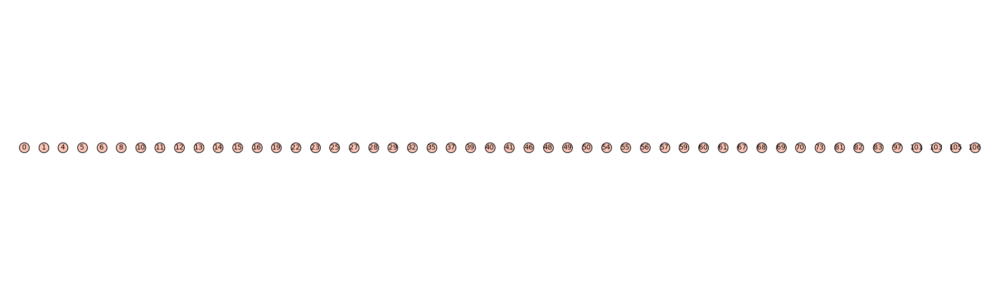

AP_Poll_2024_Week_15_domination_graph


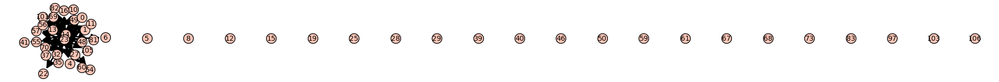

AP_Poll_2024_Week_16_domination_graph


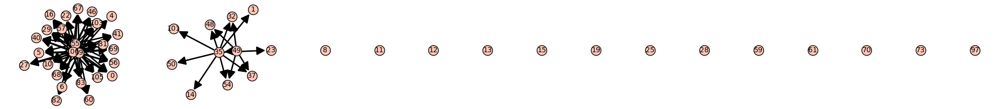

AP_Poll_2024_Final_domination_graph


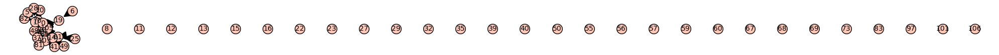

In [40]:
for name, graph in domination_graphs_by_year[2021].items():
    print(f'AP_Poll_2021_{name}_domination_graph')
    graph.show(figsize=20)
    
for name, graph in domination_graphs_by_year[2022].items():
    print(f'AP_Poll_2022_{name}_domination_graph')
    graph.show(figsize=20)
    
for name, graph in domination_graphs_by_year[2023].items():
    print(f'AP_Poll_2023_{name}_domination_graph')
    graph.show(figsize=20)
    
for name, graph in domination_graphs_by_year[2024].items():
    print(f'AP_Poll_2024_{name}_domination_graph')
    graph.show(figsize=20)

In [ ]:
# Process counting all arcs in a season and creating arc count list to be used in graphic
total_arcs_2021 = sum( weekly_graph.num_edges()
    for weekly_graph in domination_graphs_by_year[2021].values()
)
arcs_2021_list = [graph.num_edges()/total_arcs_2021 for graph in domination_graphs_by_year[2021].values()]

total_arcs_2022 = sum( weekly_graph.num_edges()
    for weekly_graph in domination_graphs_by_year[2022].values()
)
arcs_2022_list = [graph.num_edges()/total_arcs_2022 for graph in domination_graphs_by_year[2022].values()]

total_arcs_2023 = sum( weekly_graph.num_edges()
    for weekly_graph in domination_graphs_by_year[2023].values()
)
arcs_2023_list = [graph.num_edges()/total_arcs_2023 for graph in domination_graphs_by_year[2023].values()]

total_arcs_2024 = sum( weekly_graph.num_edges()
    for weekly_graph in domination_graphs_by_year[2024].values()
)
arcs_2024_list = [graph.num_edges()/total_arcs_2024 for graph in domination_graphs_by_year[2024].values()]



**Preparing the Arc Distribution across all Seasons**

The below are the percent of arcs in each week of the domination graphs for each of the 2021-2024 seasons.


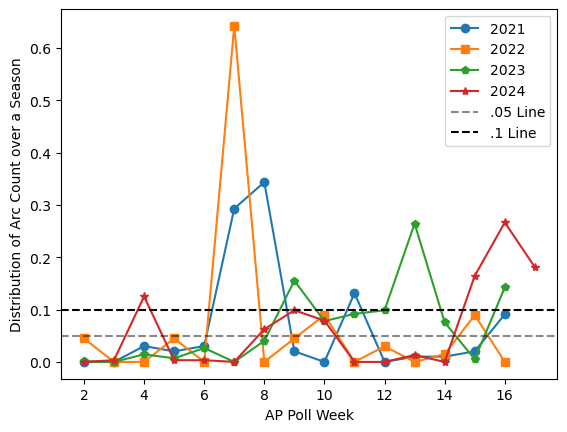

In [110]:
print('The below are the percent of arcs in each week of the domination graphs for each of the 2021-2024 seasons.')
plt.plot([2,3,4,5,6,7,8,9,10,11,12,13,14,15,16], arcs_2021_list, color='#1f77b4', marker="o", label="2021")

plt.plot([2,3,4,5,6,7,8,9,10,11,12,13,14,15,16], arcs_2022_list, color='#ff7f0e', marker="s", label="2022")

plt.plot([2,3,4,5,6,7,8,9,10,11,12,13,14,15,16], arcs_2023_list, color='#2ca02c', marker="p", label="2023")


plt.plot([2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17], arcs_2024_list, color='#d62728', marker="*", label="2024")

plt.xlabel("AP Poll Week")
plt.ylabel("Distribution of Arc Count over a Season")
plt.axhline(y=.05, color="#00000077", linestyle='--', label='.05 Line')
plt.axhline(y=.1, color="#000000", linestyle='--', label='.1 Line')
# plt.axhline(y=.2, color="#000000", linestyle='--', label='.2 Line')
# plt.axhline(y=.8949, color='#2ca02c', linestyle='--', label='Avg 2023 (after wk6)')
# plt.axhline(y=.7127, color='#d62728', linestyle='--', label='Avg 2024 (after wk6)')

# plt.axhline(y=.726, color='#1f77b4', linestyle='--', label='Avg 2021')
# plt.axhline(y=.7456, color='#ff7f0e', linestyle='--', label='Avg 2022')
# plt.axhline(y=.8135, color='#2ca02c', linestyle='--', label='Avg 2023')
# plt.axhline(y=.6564, color='#d62728', linestyle='--', label='Avg 2024')
plt.legend()
plt.show()

**Here we present the source/sink data from the domination graphs.**

In [43]:
years = [2021, 2022, 2023, 2024]
for year in years:
    print(f"Sources and how many they influence while being a Source in {year}")
    df = pd.DataFrame(list(domination_graphs_sources_by_year[year].values()))
    df_1 = df.sum().sort_values(ascending=False).to_frame(name='Sources Degree for Season')
    display(df_1)
    
    df = pd.DataFrame(list(domination_graphs_sinks_by_year[year].values()))
    df_1 = df.sum().sort_values(ascending=False).to_frame(name='Sinks Degree for Season')
    display(df_1)

Sources and how many they influence while being a Source in 2021


,Sources Degree for Season
3,20.0
24,15.0
92,10.0
26,7.0
66,4.0
1,3.0
17,3.0
99,2.0
87,2.0
10,2.0


,Sinks Degree for Season
21,7.0
24,5.0
77,5.0
105,4.0
98,4.0
68,4.0
55,4.0
27,3.0
87,3.0
4,3.0


Sources and how many they influence while being a Source in 2022


,Sources Degree for Season
15,14.0
68,6.0
71,6.0
47,5.0
98,4.0
24,4.0
11,3.0
10,3.0
96,3.0
105,3.0


,Sinks Degree for Season
49,11.0
85,10.0
75,5.0
70,3.0
20,3.0
103,3.0
59,3.0
83,3.0
98,2.0
87,2.0


Sources and how many they influence while being a Source in 2023


,Sources Degree for Season
46,61.0
83,52.0
60,41.0
4,37.0
72,33.0
16,31.0
71,30.0
31,29.0
87,26.0
51,22.0


,Sinks Degree for Season
47,51.0
59,38.0
0,35.0
100,34.0
18,33.0
104,30.0
51,30.0
39,29.0
68,27.0
82,27.0


Sources and how many they influence while being a Source in 2024


,Sources Degree for Season
39,24.0
14,23.0
55,21.0
81,19.0
12,13.0
105,11.0
46,8.0
69,7.0
49,7.0
29,6.0


,Sinks Degree for Season
70,13.0
1,12.0
37,12.0
14,11.0
57,10.0
0,10.0
105,10.0
103,10.0
81,10.0
6,9.0


**Small Working Example - Not used in our actual data sets:**

    Voter Partition 1 Partition 2 Partition 3  Partition 4  Partition 5
0  Voter1  [1, 2, 11]  [3, 4, 12]  [5, 6, 13]   [7, 8, 14]  [9, 10, 15]
1  Voter2  [1, 4, 11]  [3, 6, 12]  [5, 8, 13]  [7, 10, 14]  [9, 12, 15]
2  Voter3  [1, 2, 12]  [3, 4, 13]  [5, 6, 14]   [7, 8, 15]  [9, 10, 11]
3  Voter4  [3, 4, 11]  [1, 2, 12]  [7, 8, 13]  [9, 10, 14]   [5, 6, 15]
4  Voter5  [3, 5, 11]  [2, 4, 12]  [1, 8, 13]   [6, 7, 14]  [9, 10, 15]

    Voter   Partition 1 Partition 2 Partition 3   Partition 4   Partition 5
0  Voter1    [1, 3, 11]  [2, 4, 12]  [5, 7, 14]    [6, 8, 13]   [9, 10, 15]
1  Voter2    [1, 3, 11]  [4, 6, 12]  [5, 7, 14]   [8, 10, 13]   [9, 12, 15]
2  Voter3    [1, 2, 12]  [3, 4, 13]  [5, 6, 14]    [7, 8, 15]   [9, 10, 11]
3  Voter4     [1, 2, 3]   [4, 5, 6]   [7, 8, 9]  [10, 11, 12]  [13, 14, 15]
4  Voter5  [11, 12, 13]   [2, 3, 4]   [5, 6, 7]    [8, 9, 10]   [1, 14, 15]



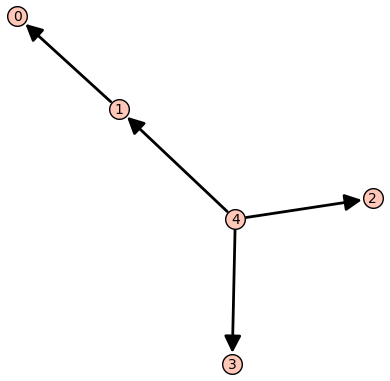

In [44]:
"""Need to make a good test data frame of values so that we show that our code works as desired. - Proof of concept here."""
test_1_entries = np.array([['Voter1', 1,2,11,3,4,12,5,6,13,7,8,14,9,10,15],
                          ['Voter2',1,4,11,3,6,12,5,8,13,7,10,14,9,12,15],
                          ['Voter3',1,2,12,3,4,13,5,6,14,7,8,15,9,10,11],
                          ['Voter4',3,4,11,1,2,12,7,8,13,9,10,14,5,6,15],
                          ['Voter5',3,5,11,2,4,12,1,8,13,6,7,14,9,10,15]]
                          )
test_1_dataframe = pd.DataFrame(test_1_entries, columns=['Voter',1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]) 

"""Need to make a good test data frame of values so that we show that our code works as desired."""
test_2_entries = np.array([['Voter1', 1,3,11,2,4,12,5,7,14,6,8,13,9,10,15],
                          ['Voter2',1,3,11,4,6,12,5,7,14,8,10,13,9,12,15],
                          ['Voter3',1,2,12,3,4,13,5,6,14,7,8,15,9,10,11],
                          ['Voter4',1,2,3,4,5,6,7,8,9,10,11,12,13,14,15],
                          ['Voter5',11,12,13,2,3,4,5,6,7,8,9,10,1,14,15]]
                          )
test_2_dataframe = pd.DataFrame(test_2_entries, columns=['Voter',1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]) 


test_1_dataframe_partitioned = partition(test_1_dataframe, [3,3,3,3,3])
print(test_1_dataframe_partitioned)
print()
test_2_dataframe_partitioned = partition(test_2_dataframe, [3,3,3,3,3])
print(test_2_dataframe_partitioned)
print()

toy_ex_2v1_list = domination_binary_list_for_directed_graph(test_2_dataframe_partitioned, test_1_dataframe_partitioned, [3,3,3,3,3], [1,1,1,1,1])
toy_ex_2v1_graph, toy_ex_2v1_matrix = domination_graph_matrix(toy_ex_2v1_list,5)
toy_ex_2v1_graph.show()

In [45]:
test_1_dataframe
test_1_dataframe_partitioned

,Voter,Partition 1,Partition 2,Partition 3,Partition 4,Partition 5
0,Voter1,"[1, 2, 11]","[3, 4, 12]","[5, 6, 13]","[7, 8, 14]","[9, 10, 15]"
1,Voter2,"[1, 4, 11]","[3, 6, 12]","[5, 8, 13]","[7, 10, 14]","[9, 12, 15]"
2,Voter3,"[1, 2, 12]","[3, 4, 13]","[5, 6, 14]","[7, 8, 15]","[9, 10, 11]"
3,Voter4,"[3, 4, 11]","[1, 2, 12]","[7, 8, 13]","[9, 10, 14]","[5, 6, 15]"
4,Voter5,"[3, 5, 11]","[2, 4, 12]","[1, 8, 13]","[6, 7, 14]","[9, 10, 15]"
